# Notebook 29 — Indicateurs morphologiques : SVF, GVI, perméabilité

**Détail complet du calcul, des équations et des sources.**

Ce notebook produit les trois indicateurs image demandés par l'offre de stage CoolPath, chacun avec sa justification mathématique et sa source bibliographique.

| Indicateur | Nature du calcul | Source méthodologique |
|---|---|---|
| **SVF** (Sky View Factor) | intégration pondérée par angle solide + loi de Lambert | Steyn (1980), Honjo et al. (2019) |
| **GVI** (Green View Index) | fraction d'aire visuelle | Yang et al. (2009) |
| **Perméabilité** | reclassification matériau → hydrologie | ⚠️ jugement d'ingénierie — voir §5 |

**Entrées requises** (produites par les notebooks précédents) :
- `dataset_coolpath_360/images` + `labels` (nb23)
- `fusion_3models_v2/masks_semantic` (prédictions Mask2Former, nb25)
- `fusion_3models_v2/masks_fused` (matériaux après gating, nb25)

---

## Liens des sources

| Réf | Référence complète | Lien |
|---|---|---|
| **S1** | Steyn, D.G. (1980), *The calculation of view factors from fisheye-lens photographs: Research note*, Atmosphere-Ocean, 18(3), 254–258 | https://doi.org/10.1080/07055900.1980.9649091 |
| **S2** | Honjo, T., Seo, Y. et al. (2019), *Sky view factor measurement by using a spherical camera*, Journal of Agricultural Meteorology, 75(2), 59–66 | https://doi.org/10.2480/agrmet.D-18-00027 |
| **S3** | Yang, J., Zhao, L., McBride, J., Gong, P. (2009), *Can you see green? Assessing the visibility of urban forests in cities*, Landscape and Urban Planning, 91(2), 97–104 | https://doi.org/10.1016/j.landurbplan.2008.12.004 |
| **S4** | Kim, S.W., Brown, R.D. (2022), *Pedestrians' behavior based on outdoor thermal comfort and micro-scale thermal environments, Austin TX*, Science of the Total Environment, 808, 152143 | https://doi.org/10.1016/j.scitotenv.2021.152143 |
| **S5** | Cerema / AURCA — *Notice d'utilisation des données de désimperméabilisation* (méthode de classification perméable/imperméable, traitement contextuel des arbres) | https://www.aurca.org/content/uploads/2025/11/notice-utilisation-donnees-desimper-aurca-vf.pdf |
| **S6** | Copernicus HRL *Imperviousness* — donnée de référence européenne utilisée par le Cerema (méthodologie SCOT) | https://www.nature-en-ville.com/sites/nature-en-ville/files/document/2023-12/M%C3%A9thodologie_V11_V%20FINALE%20(1)_compressed.pdf |
| **S7** | Plante & Cité (2021), *Revêtements perméables des aménagements urbains : typologie et caractéristiques techniques* (référencé par le Cerema, accès restreint) | https://eauetville.cerema.fr/ressources/base-documentaire/revetements-permeables-des-amenagements-urbains-typologie-et |
| **S8** | Cerema — *La désimperméabilisation des sols : du principe à la mise en œuvre* | https://www.cerema.fr/system/files/documents/2022/11/2022_plaquette_desimpermeabilisation.pdf |

## 1. Environnement et chargement

In [1]:
import random
from pathlib import Path

import numpy as np
import cv2
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

PROJECT_ROOT   = Path("..").resolve()
DATASET_DIR    = PROJECT_ROOT / "data" / "outputs" / "dataset_coolpath_360"
IMG_DIR        = DATASET_DIR / "images"
LBL_DIR        = DATASET_DIR / "labels"
SEM_MASKS_DIR  = PROJECT_ROOT / "data" / "outputs" / "fusion_3models_v2" / "masks_semantic"
FUSED_DIR      = PROJECT_ROOT / "data" / "outputs" / "fusion_3models_v2" / "masks_fused"

OUTPUT_DIR = PROJECT_ROOT / "data" / "outputs" / "indicateurs_v2"
VIZ_DIR    = OUTPUT_DIR / "viz"
for d in (OUTPUT_DIR, VIZ_DIR):
    d.mkdir(parents=True, exist_ok=True)

assert IMG_DIR.exists(), f"Dataset introuvable : {IMG_DIR} (executer nb23)"
image_paths = sorted(list(IMG_DIR.glob("*.jpg")) + list(IMG_DIR.glob("*.png")))
print(f"{len(image_paths)} images trouvees")

# --- Taxonomies ---
CITYSCAPES_ORDER = [
    "road", "sidewalk", "building", "wall", "fence", "pole", "traffic_light",
    "traffic_sign", "vegetation", "terrain", "sky", "person", "rider",
    "car", "truck", "bus", "train", "motorcycle", "bicycle",
]
SEM_ROAD, SEM_SIDEWALK, SEM_BUILDING, SEM_VEGETATION, SEM_TERRAIN, SEM_SKY = 0, 1, 2, 8, 9, 10

BFMS_ID2LABEL = {
    0:"Background",1:"Wood/Bamboo",2:"Ground tile",3:"Brick",4:"Cardboard/Paper",
    5:"Tree",6:"Roof tile",7:"Ceramic",8:"Chalkboard/Blackboard",9:"Asphalt",
    10:"Cement/Concrete",11:"Composite decorative board",12:"Rammed earth",
    13:"Fabric/Cloth",14:"Water",15:"Windows with metal fences",16:"Foliage",
    17:"Food",18:"Fur",19:"Pottery",20:"Glass",21:"Hair",
    22:"Roofing waterproof material",23:"Ice",24:"Leather",25:"Carved brick",
    26:"Metal",27:"Mirror",28:"Enamel",29:"Paint/Coating/Plaster",30:"Window screen",
    31:"Whiteboard",32:"Photograph/Painting/Airbrushed fabric",33:"Plastic, clear",
    34:"Plastic, non-clear",35:"Rubber/Latex",36:"Sand",37:"Skin/Lips",
    38:"Sky",39:"Snow",40:"Engineered Stone/Imitation Stone",41:"Soil/Mud",42:"Natural Stone",
}
BFMS_NAMES = [BFMS_ID2LABEL[i] for i in range(43)]
B = {n: i for i, n in enumerate(BFMS_NAMES)}


def load_semantic(stem):
    # Predictions Mask2Former (nb25) si disponibles, sinon repli sur le GT annote
    f = SEM_MASKS_DIR / f"{stem}_sem.png"
    if f.exists():
        return cv2.imread(str(f), cv2.IMREAD_GRAYSCALE)
    return np.array(Image.open(LBL_DIR / f"{stem}.png"))


def load_fused(stem):
    f = FUSED_DIR / f"{stem}_fused.png"
    return cv2.imread(str(f), cv2.IMREAD_GRAYSCALE) if f.exists() else None


# Verification de la geometrie equirectangulaire
_img = cv2.imread(str(image_paths[0]))
_H, _W = _img.shape[:2]
print(f"Resolution : {_W}x{_H}  |  ratio = {_W/_H:.2f} (2.00 attendu pour equirectangulaire)")
assert abs(_W / _H - 2.0) < 0.05, "Ratio non equirectangulaire : verifier les images sources"

116 images trouvees
Resolution : 3072x1536  |  ratio = 2.00 (2.00 attendu pour equirectangulaire)


## 2. Géométrie de l'image équirectangulaire

Toute la suite repose sur la correspondance entre **position dans l'image** et **direction dans l'espace**.

Une image équirectangulaire de dimensions $W \times H$ couvre la sphère complète :
- l'axe **vertical** (ligne $i$) code l'angle **zénithal** $\theta \in [0, \pi]$ : $\theta = 0$ au zénith (haut), $\theta = \pi/2$ à l'horizon, $\theta = \pi$ au nadir (bas)
- l'axe **horizontal** (colonne $j$) code l'**azimut** $\phi \in [0, 2\pi]$

$$\theta_i = \frac{i + 0{,}5}{H}\pi \qquad \phi_j = \frac{j + 0{,}5}{W}2\pi$$

**Le problème central : les pixels ne représentent PAS des angles solides égaux.**

L'élément d'angle solide sur une sphère est :

$$d\Omega = \sin\theta \; d\theta \, d\phi$$

Le facteur $\sin\theta$ signifie qu'une ligne près du zénith ($\theta \approx 0$, $\sin\theta \approx 0$) correspond à une portion **minuscule** du ciel réel, alors qu'une ligne près de l'horizon ($\theta \approx \pi/2$, $\sin\theta = 1$) correspond à une portion **maximale** — alors que les deux occupent le même nombre de pixels dans l'image.

C'est la déformation classique des projections cylindriques (le Groenland surdimensionné sur une carte du monde). **Tout comptage naïf de pixels hérite de ce biais.**

In [2]:
def angles_equirect(H, W):
    # Retourne (theta par ligne [0,pi], phi par colonne [0,2pi])
    theta = (np.arange(H) + 0.5) / H * np.pi
    phi   = (np.arange(W) + 0.5) / W * 2 * np.pi
    return theta, phi


# --- Demonstration numerique du biais ---
H, W = 1536, 3072
theta, _ = angles_equirect(H, W)
w_solid = np.sin(theta)               # poids d'angle solide

print("Bandes de MEME largeur angulaire (20 deg), a differentes hauteurs :\n")
print(f"{'position':<12}{'plage theta':<16}{'% des lignes':<15}{'% angle solide reel'}")
print("-" * 62)
for lo, hi, nom in [(0, 20, "zenith"), (80, 100, "horizon"), (160, 180, "nadir")]:
    band = (theta >= np.radians(lo)) & (theta <= np.radians(hi))
    naif = band.mean() * 100
    reel = np.sum(band * w_solid) / np.sum(w_solid) * 100
    print(f"{nom:<12}{f'{lo}-{hi} deg':<16}{naif:<15.2f}{reel:.2f}")

print("\n-> Meme nombre de pixels, mais l'angle solide reel varie d'un facteur ~5,7")
print("   entre une bande au zenith et une bande a l'horizon.")

# Validation : l'integrale de sin(theta) sur [0,pi] doit valoir 2
integrale = np.sum(w_solid) * np.pi / H
print(f"\nControle : integrale de sin(theta) sur [0,pi] = {integrale:.4f} (valeur exacte : 2)")
assert abs(integrale - 2.0) < 0.01

Bandes de MEME largeur angulaire (20 deg), a differentes hauteurs :

position    plage theta     % des lignes   % angle solide reel
--------------------------------------------------------------
zenith      0-20 deg        11.13          3.03
horizon     80-100 deg      11.07          17.30
nadir       160-180 deg     11.13          3.03

-> Meme nombre de pixels, mais l'angle solide reel varie d'un facteur ~5,7
   entre une bande au zenith et une bande a l'horizon.

Controle : integrale de sin(theta) sur [0,pi] = 2.0000 (valeur exacte : 2)


## 3. Sky View Factor (SVF)

### Définition physique

Le SVF est la **fraction du rayonnement diffus isotrope** qu'une surface horizontale reçoit du ciel visible, rapportée à celle qu'elle recevrait sous un hémisphère totalement dégagé. Il vaut 1 en plein champ, 0 au fond d'un canyon totalement fermé.

### Équation

$$SVF = \frac{1}{\pi}\int_0^{2\pi}\!\!\int_0^{\pi/2} \text{ciel}(\theta,\phi)\, \cos\theta \, \sin\theta \; d\theta \, d\phi$$

**Deux facteurs, deux rôles physiques distincts** (S1, S2) :

| Facteur | Rôle |
|---|---|
| $\sin\theta$ | corrige la **déformation de projection** (élément d'angle solide, §2) |
| $\cos\theta$ | **loi de Lambert** : un rayon incident à l'angle $\theta$ n'apporte à une surface horizontale qu'une fraction $\cos\theta$ de son énergie (incidence rasante ⇒ apport faible) |

Le dénominateur $\pi$ est la valeur de l'intégrale pour un hémisphère entièrement dégagé, ce qui normalise le SVF à 1.

### Discrétisation sur image équirectangulaire

Chaque ligne $i$ a un $\theta$ constant, donc l'intégrale sur $\phi$ se réduit à la **fraction de pixels ciel de cette ligne** :

$$SVF = \frac{\sum_{i \in \text{hémisphère sup.}} f_i \cos\theta_i \sin\theta_i}{\sum_{i \in \text{hémisphère sup.}} \cos\theta_i \sin\theta_i}, \qquad f_i = \frac{\text{pixels ciel de la ligne } i}{W}$$

### Pourquoi cette formulation plutôt qu'une reprojection fisheye

La plupart des logiciels (RayMan, UMEP) reprojettent l'image en fisheye puis comptent les pixels. **Deux écueils documentés :**

1. **Projection équidistante vs équisolide** — S2 (Fig. 4) mesure sur une image test : SVF = 0,267 en équidistant contre **0,296 en équisolide**, soit une sous-estimation de 2,9 points.
2. **Absence de pondération de Lambert** — S2 rapporte, d'après Hämmerle et al. (2011) et Middel et al. (2017), qu'un simple comptage de pixels sur une image équisolide **sous-estime encore le SVF en gamme moyenne**, faute du facteur $\cos\theta$.

L'intégration directe ci-dessous applique **les deux corrections simultanément**, sans reprojection intermédiaire — c'est la méthode Steyn (1980) complète.

In [3]:
def svf_weights(H):
    # Poids par ligne pour l'integration SVF (hemisphere superieur uniquement).
    # Convention : ligne 0 = zenith (theta=0), ligne H-1 = nadir (theta=pi).
    theta = (np.arange(H) + 0.5) / H * np.pi
    upper = theta <= np.pi / 2
    weights = np.where(upper, np.cos(theta) * np.sin(theta), 0.0)
    return theta, weights, upper


def compute_svf(sky_mask):
    # Sky View Factor par integration ponderee angle solide x loi de Lambert.
    # sky_mask : tableau booleen (H, W), True ou le ciel est visible.
    # Retourne un float dans [0, 1].
    # Reference : Steyn (1980) ; Honjo et al. (2019).
    H, W = sky_mask.shape
    _, weights, upper = svf_weights(H)
    frac_par_ligne = sky_mask[upper].sum(axis=1) / W      # f_i
    return float(np.sum(frac_par_ligne * weights[upper]) / np.sum(weights[upper]))


# =============== AUTO-VALIDATION (executee a chaque lancement) ===============
Ht, Wt = 1536, 3072
theta_t, _, upper_t = svf_weights(Ht)

def _bande(lo_deg, hi_deg):
    m = np.zeros((Ht, Wt), dtype=bool)
    m[(theta_t >= np.radians(lo_deg)) & (theta_t <= np.radians(hi_deg))] = True
    return m

# Cas analytique exact : ciel visible pour theta <= a
#   SVF = [sin^2(a)] / [sin^2(pi/2)] = sin^2(a)
cas = [
    ("ciel total (0-90 deg)",       _bande(0, 90),   1.000),
    ("aucun ciel",                  np.zeros((Ht, Wt), bool), 0.000),
    ("cone zenithal 0-30 deg",      _bande(0, 30),   np.sin(np.radians(30))**2),   # = 0.250
    ("cone zenithal 0-45 deg",      _bande(0, 45),   np.sin(np.radians(45))**2),   # = 0.500
    ("cone zenithal 0-60 deg",      _bande(0, 60),   np.sin(np.radians(60))**2),   # = 0.750
]

print("=== Auto-validation de compute_svf() contre la solution analytique ===")
print("   (pour un cone zenithal d'ouverture a : SVF = sin^2(a), demonstration ci-dessous)\n")
ok_all = True
for nom, mask, attendu in cas:
    val = compute_svf(mask)
    ok = abs(val - attendu) < 0.005
    ok_all &= ok
    print(f"  {nom:<26} calcule={val:.4f}  analytique={attendu:.4f}  {'OK' if ok else 'ECHEC'}")
assert ok_all, "La formule SVF echoue la validation analytique - ne pas continuer"
print("\nToutes les validations passent.")

=== Auto-validation de compute_svf() contre la solution analytique ===
   (pour un cone zenithal d'ouverture a : SVF = sin^2(a), demonstration ci-dessous)

  ciel total (0-90 deg)      calcule=1.0000  analytique=1.0000  OK
  aucun ciel                 calcule=0.0000  analytique=0.0000  OK
  cone zenithal 0-30 deg     calcule=0.2500  analytique=0.2500  OK
  cone zenithal 0-45 deg     calcule=0.5000  analytique=0.5000  OK
  cone zenithal 0-60 deg     calcule=0.7500  analytique=0.7500  OK

Toutes les validations passent.


### Démonstration de la solution analytique utilisée ci-dessus

Pour un cône de ciel visible d'ouverture $a$ autour du zénith :

$$SVF(a) = \frac{\int_0^{a}\cos\theta\sin\theta \, d\theta}{\int_0^{\pi/2}\cos\theta\sin\theta \, d\theta}$$

En posant $u = \sin\theta$, $du = \cos\theta \, d\theta$ :

$$\int_0^{a}\cos\theta\sin\theta \, d\theta = \int_0^{\sin a} u \, du = \frac{\sin^2 a}{2}$$

Le dénominateur vaut donc $\frac{\sin^2(\pi/2)}{2} = \frac{1}{2}$, d'où :

$$\boxed{SVF(a) = \sin^2 a}$$

C'est cette formule fermée qui sert de vérité de référence dans la cellule de validation : un cône de 45° doit donner exactement $\sin^2 45° = 0{,}5$, un cône de 30° exactement $0{,}25$. Les valeurs calculées correspondent — la discrétisation est correcte.

## 4. Green View Index (GVI)

### Définition

Le GVI mesure la **quantité de végétation visible depuis le point de vue du piéton**. Introduit par Yang et al. (2009) (**S3**), c'est un indicateur de **perception visuelle**, pas de géométrie radiative.

$$GVI = \frac{\text{aire de végétation visible}}{\text{aire totale visible}} \times 100$$

### ⚠️ Différence conceptuelle importante avec le SVF

| | SVF | GVI |
|---|---|---|
| Nature | flux radiatif | perception visuelle |
| Domaine | hémisphère supérieur | sphère complète |
| Pondération | $\cos\theta \sin\theta$ | **aucune** (définition originale S3) |

Le GVI **n'est pas pondéré** dans sa définition d'origine — c'est un ratio d'aire d'image brute. Le conserver ainsi assure la **comparabilité avec la littérature**.

Ce notebook calcule néanmoins **les deux variantes**, pour transparence :
- `GVI_aire` — définition standard S3, **à utiliser pour publier/comparer**
- `GVI_angle_solide` — pondéré par $\sin\theta$ sur la sphère complète, plus juste géométriquement si l'on veut la vraie proportion de directions occupées par la végétation

L'écart entre les deux quantifie le biais de projection sur vos images. **Reporter `GVI_aire` par défaut**, et mentionner l'autre en analyse de sensibilité.

In [4]:
def compute_gvi(veg_mask, valid_mask):
    # Green View Index, deux variantes.
    # veg_mask   : booleen (H, W), True sur les pixels vegetation
    # valid_mask : booleen (H, W), True sur les pixels exploitables (hors ignore)
    # Retourne (gvi_aire, gvi_angle_solide) en pourcentage.
    # Reference : Yang et al. (2009) pour la definition d'aire.
    H, W = veg_mask.shape

    # --- Variante 1 : definition standard (fraction d'aire brute) ---
    gvi_aire = veg_mask[valid_mask].sum() / max(valid_mask.sum(), 1) * 100

    # --- Variante 2 : ponderee par l'angle solide (sphere complete) ---
    theta = (np.arange(H) + 0.5) / H * np.pi
    w = np.sin(theta)[:, None]                       # poids par ligne, diffuse sur W
    num = float(np.sum((veg_mask & valid_mask) * w))
    den = float(np.sum(valid_mask * w))
    gvi_solid = num / max(den, 1e-9) * 100

    return gvi_aire, gvi_solid


# --- Validation sur cas synthetiques ---
Ht, Wt = 512, 1024
valid_t = np.ones((Ht, Wt), dtype=bool)
theta_t = (np.arange(Ht) + 0.5) / Ht * np.pi

print("=== Validation de compute_gvi() ===\n")
# Cas 1 : tout vegetation -> 100 % dans les deux variantes
v = np.ones((Ht, Wt), dtype=bool)
a, s = compute_gvi(v, valid_t)
print(f"  tout vegetation        : aire={a:6.2f} %  angle_solide={s:6.2f} %  (100 attendu)")
assert abs(a - 100) < 0.01 and abs(s - 100) < 0.01

# Cas 2 : rien -> 0 %
v = np.zeros((Ht, Wt), dtype=bool)
a, s = compute_gvi(v, valid_t)
print(f"  aucune vegetation      : aire={a:6.2f} %  angle_solide={s:6.2f} %  (0 attendu)")
assert a == 0 and s == 0

# Cas 3 : bande horizontale au zenith -> l'aire surestime largement l'angle solide
v = np.zeros((Ht, Wt), dtype=bool)
v[theta_t <= np.radians(20)] = True
a, s = compute_gvi(v, valid_t)
print(f"  bande zenith (0-20 deg): aire={a:6.2f} %  angle_solide={s:6.2f} %  <- ecart de projection")

# Cas 4 : bande a l'horizon -> l'aire sous-estime l'angle solide
v = np.zeros((Ht, Wt), dtype=bool)
v[(theta_t >= np.radians(80)) & (theta_t <= np.radians(100))] = True
a, s = compute_gvi(v, valid_t)
print(f"  bande horizon (80-100) : aire={a:6.2f} %  angle_solide={s:6.2f} %  <- ecart inverse")
print("\n-> Les deux variantes different systematiquement : reporter GVI_aire (standard S3),")
print("   et GVI_angle_solide en analyse de sensibilite.")

=== Validation de compute_gvi() ===

  tout vegetation        : aire=100.00 %  angle_solide=100.00 %  (100 attendu)
  aucune vegetation      : aire=  0.00 %  angle_solide=  0.00 %  (0 attendu)
  bande zenith (0-20 deg): aire= 11.13 %  angle_solide=  3.03 %  <- ecart de projection
  bande horizon (80-100) : aire= 10.94 %  angle_solide= 17.10 %  <- ecart inverse

-> Les deux variantes different systematiquement : reporter GVI_aire (standard S3),
   et GVI_angle_solide en analyse de sensibilite.


## 5. Perméabilité des sols

### ⚠️ Statut de cette classification — à lire avant utilisation

Contrairement au SVF (géométrie pure) et au GVI (définition publiée), **la classification perméable/imperméable ci-dessous relève d'un jugement d'ingénierie**, appuyé sur le principe hydrologique de base :

> surface non poreuse ⇒ l'eau ruisselle ⇒ **imperméable**
> surface poreuse ⇒ l'eau s'infiltre ⇒ **perméable**

**Ce qui n'a PAS été trouvé** : aucune table officielle Cerema associant directement les 43 classes de matériaux BFMS à une catégorie hydrologique. Les sources institutionnelles consultées travaillent à d'autres échelles ou d'autres nomenclatures :

- **S6 — Copernicus HRL Imperviousness** : donnée satellite de référence utilisée par le Cerema, mais raster continu 0–100 % à 10 m de résolution — pas une liste de matériaux.
- **S5 — Cerema/AURCA** : méthode de classification par télédétection, avec une **règle contextuelle notable** (voir ci-dessous).
- **S7 — Plante & Cité (2021)** : typologie technique des revêtements perméables, référencée par le Cerema, mais **accès restreint** — n'a pas pu être consultée.

### Point méthodologique important repris de S5 (Cerema/AURCA)

La notice AURCA précise que **la classe « Arbres » n'est pas automatiquement perméable** : un arbre en pleine terre (parc, jardin) l'est, mais un pied d'arbre entouré de bitume ou un parking arboré ne l'est pas. Leur méthode affecte l'arbre à l'une ou l'autre classe **selon la nature des surfaces environnantes**.

⚠️ **Ce notebook n'implémente pas cette règle contextuelle** : la classe sémantique `vegetation` n'est pas analysée par voisinage. C'est une limite connue, à corriger si vous souhaitez suivre la méthode Cerema de près.

### Action recommandée avant de publier ces chiffres

1. Vérifier la table interne du projet (documentation CoolPath, `questions_1.pdf`) qui définit `sol_perméable` / `sol_imperméable`
2. Demander à Auline Rodler s'il existe une table Cerema matériau → perméabilité
3. À défaut, présenter ces taux comme **estimation par jugement d'ingénierie**, avec la liste explicite ci-dessous — jamais comme une valeur normative

### Formule

$$\tau_{\text{imperm}} = \frac{\#\{\text{pixels de sol de matériau imperméable}\}}{\#\{\text{pixels de sol}\}}\times 100$$

avec « pixels de sol » = classes sémantiques `road` ∪ `sidewalk` ∪ `terrain`. Une troisième catégorie **`indéterminé`** est comptabilisée séparément : elle mesure la part du sol dont le matériau n'est pas classable — **contrôle de fiabilité essentiel**, un taux élevé invalide les deux autres.

In [5]:
# =============================================================================
# PERMEABILITE CONTEXTUELLE  (semantique x materiau)
# -----------------------------------------------------------------------------
# Correction demandee en reunion : "terrain ou vegetation basse peuvent etre
# permeables - il faut compter quelle partie de la vegetation est permeable".
#
# Cityscapes distingue deja les deux etages (definition officielle) :
#   classe 8 "vegetation" = arbres, haies  -> vegetation VERTICALE (canopee)
#   classe 9 "terrain"    = herbe, sol nu  -> vegetation HORIZONTALE + sol
#
# Consequence hydrologique :
#   - terrain + herbe/sol      -> PERMEABLE (pelouse, terre, sable)
#   - terrain + asphalte/beton -> IMPERMEABLE (allee de parc bitumee)
#   - vegetation HAUTE (canopee) -> le sol dessous n'est PAS OBSERVABLE
#       un arbre peut etre en pleine terre OU en fosse bitumee. Le Cerema/AURCA
#       (S5) traite ce cas par analyse du VOISINAGE ; ici on l'exclut du
#       denominateur et on le comptabilise separement, plutot que de trancher.
# STATUT : jugement d'ingenierie, non normatif (cf. section 5).
# =============================================================================

IMPERMEABLE = {
    B["Asphalt"], B["Cement/Concrete"], B["Ground tile"], B["Natural Stone"],
    B["Engineered Stone/Imitation Stone"], B["Brick"], B["Carved brick"],
    B["Roofing waterproof material"],
}
PERMEABLE = {
    B["Soil/Mud"], B["Sand"], B["Rammed earth"],
}

# --- SURCHARGES CONTEXTUELLES : (classe_semantique, materiau) -> categorie ---
PERM_OVERRIDES = {
    # Vegetation BASSE sur terrain = pelouse -> surface permeable
    (SEM_TERRAIN, B["Foliage"]): 1,
    (SEM_TERRAIN, B["Tree"]):    1,
    # Sol nu / sable sur terrain (deja permeables, explicites ici pour tracabilite)
    (SEM_TERRAIN, B["Soil/Mud"]): 1,
    (SEM_TERRAIN, B["Sand"]):     1,
    # Allee de parc revetue : terrain mais surface minerale -> impermeable
    (SEM_TERRAIN, B["Asphalt"]):         0,
    (SEM_TERRAIN, B["Cement/Concrete"]): 0,
    (SEM_TERRAIN, B["Ground tile"]):     0,
    # Vegetation basse detectee sur trottoir/route : herbe entre les paves
    (SEM_SIDEWALK, B["Foliage"]): 1,
    (SEM_ROAD,     B["Foliage"]): 1,
}

# Sols observables (le sol sous une canopee n'est PAS observable -> exclu)
SEM_SOL = {SEM_ROAD, SEM_SIDEWALK, SEM_TERRAIN}
SEM_CANOPEE = {SEM_VEGETATION}     # comptabilise a part

# --- Table 2D : [classe_semantique, materiau] ; -1 indetermine, 0 imperm, 1 perm
perm_lut = np.full((19, 43), -1, dtype=np.int8)
for m in IMPERMEABLE:
    perm_lut[:, m] = 0
for m in PERMEABLE:
    perm_lut[:, m] = 1
for (s, m), cat in PERM_OVERRIDES.items():
    perm_lut[s, m] = cat

print("=== Classification de base (tous contextes) ===")
print(f"  IMPERMEABLE : {sorted(BFMS_NAMES[m] for m in IMPERMEABLE)}")
print(f"  PERMEABLE   : {sorted(BFMS_NAMES[m] for m in PERMEABLE)}")
print(f"\n=== Surcharges contextuelles ({len(PERM_OVERRIDES)}) ===")
for (s, m), cat in sorted(PERM_OVERRIDES.items()):
    lib = "PERMEABLE" if cat == 1 else "IMPERMEABLE"
    print(f"  {CITYSCAPES_ORDER[s]:<10} + {BFMS_NAMES[m]:<18} -> {lib}")
print("\n-> la vegetation HAUTE (canopee) est exclue du denominateur :")
print("   le sol sous un arbre n'est pas observable depuis l'image (S5).")


def compute_permeabilite(sem, fused):
    # Permeabilite des surfaces de sol OBSERVABLES (road + sidewalk + terrain).
    # Retourne (imperm %, perm %, indetermine %, n_pixels_sol, pct_canopee_non_observable).
    # La categorie depend du COUPLE (classe semantique, materiau) - cf. PERM_OVERRIDES.
    if fused is None:
        return None, None, None, 0, None
    valid = sem != 255
    sol = np.isin(sem, list(SEM_SOL)) & valid
    n_sol = int(sol.sum())

    # part de l'image occupee par de la canopee (sol masque, non observable)
    canopee = np.isin(sem, list(SEM_CANOPEE)) & valid
    pct_canopee = float(canopee.sum()) / max(int(valid.sum()), 1) * 100

    if n_sol == 0:
        return None, None, None, 0, round(pct_canopee, 1)

    classes = perm_lut[sem[sol].astype(np.int64), fused[sol]]
    return (round(float((classes == 0).sum()) / n_sol * 100, 1),
            round(float((classes == 1).sum()) / n_sol * 100, 1),
            round(float((classes == -1).sum()) / n_sol * 100, 1),
            n_sol,
            round(pct_canopee, 1))


# --- Validation sur cas synthetiques ---
print("\n=== Validation de compute_permeabilite() ===")
_sem = np.full((10, 10), SEM_TERRAIN, dtype=np.uint8)
_fus = np.full((10, 10), B["Foliage"], dtype=np.uint8)
r = compute_permeabilite(_sem, _fus)
print(f"  terrain + Foliage (pelouse)      -> perm={r[1]} %   (100 attendu)")
assert r[1] == 100.0

_sem[:] = SEM_VEGETATION
r = compute_permeabilite(_sem, _fus)
print(f"  vegetation haute + Foliage       -> sol observable={r[3]} px, canopee={r[4]} %")
assert r[3] == 0, "la canopee ne doit pas compter comme sol observable"

_sem[:] = SEM_TERRAIN
_fus[:] = B["Asphalt"]
r = compute_permeabilite(_sem, _fus)
print(f"  terrain + Asphalt (allee revetue)-> imperm={r[0]} %   (100 attendu)")
assert r[0] == 100.0
print("\nToutes les validations passent.")

=== Classification de base (tous contextes) ===
  IMPERMEABLE : ['Asphalt', 'Brick', 'Carved brick', 'Cement/Concrete', 'Engineered Stone/Imitation Stone', 'Ground tile', 'Natural Stone', 'Roofing waterproof material']
  PERMEABLE   : ['Rammed earth', 'Sand', 'Soil/Mud']

=== Surcharges contextuelles (9) ===
  road       + Foliage            -> PERMEABLE
  sidewalk   + Foliage            -> PERMEABLE
  terrain    + Ground tile        -> IMPERMEABLE
  terrain    + Tree               -> PERMEABLE
  terrain    + Asphalt            -> IMPERMEABLE
  terrain    + Cement/Concrete    -> IMPERMEABLE
  terrain    + Foliage            -> PERMEABLE
  terrain    + Sand               -> PERMEABLE
  terrain    + Soil/Mud           -> PERMEABLE

-> la vegetation HAUTE (canopee) est exclue du denominateur :
   le sol sous un arbre n'est pas observable depuis l'image (S5).

=== Validation de compute_permeabilite() ===
  terrain + Foliage (pelouse)      -> perm=100.0 %   (100 attendu)
  vegetation haute 

## 5bis. Distinguer buisson (au sol) et canopée (arbre) — sans nouveau modèle

### Le problème observé

La classe sémantique `vegetation` (Cityscapes, classe 8) mélange **deux réalités
physiques différentes** : un buisson/haie enraciné au sol, dont le feuillage occupe
lui-même la surface (comme de l'herbe haute — perméable), et une canopée d'arbre,
élevée au-dessus du sol réel qui reste invisible dessous (matériau inconnu — non
observable). Un test visuel sur `GS017069[1]_equirect__f008520` a confirmé que
plusieurs zones de buissons bas, en contact direct avec l'allée, étaient classées
« canopée non observable » (violet) alors qu'elles devraient compter comme
perméables (vert) — 31,2 % de canopée alors qu'une partie significative est en
réalité de la végétation basse.

### La solution retenue — et celle écartée

Un modèle externe supplémentaire pour distinguer arbre/buisson a été testé (RMSNet,
classes `grass`/`leaf`) et **rejeté après contrôle visuel** : erreurs massives
(sky classé `metal`, structures classées au hasard), même symptôme de décalage de
domaine que BFMS.

**Solution retenue : une heuristique géométrique, sans aucun modèle supplémentaire.**
Elle réutilise uniquement la géométrie équirectangulaire déjà définie en §2
(`angles_equirect`) et le masque sémantique déjà fiable (Mask2Former, nb23). Elle
contourne aussi BFMS pour cette classe — un avantage supplémentaire, puisque
la fiabilité de BFMS est déjà mise en cause ailleurs dans le pipeline (nb25).

### Principe (v2 — corrigé après contrôle visuel)

**Une première version (par blob entier, composantes connexes) a été testée et a
échoué** : sur `GS017069[1]_equirect__f008520`, elle n'a produit que 0,1 % de
changement. Cause identifiée : un buisson touche presque toujours le tronc ou les
branches basses de l'arbre au-dessus — c'est **un seul blob connecté** dans le
masque sémantique, et la classification par « point le plus haut du blob »
faisait hériter tout le buisson de la hauteur de l'arbre.

**Correction : chaque pixel est classé individuellement**, sans notion de blob :

$$\text{élévation}(pixel) = 90° - \theta(pixel)$$

- élévation du pixel **sous le seuil** → végétation basse (perméable)
- élévation du pixel **au-dessus** → canopée (non observable, inchangé)

Un même arbre peut ainsi avoir sa base classée « basse » et sa cime classée
« haute » — c'est le comportement recherché : le pixel-frontière entre buisson
et tronc n'a pas de raison physique d'appartenir à un seul bloc homogène.

⚠️ **`SEUIL_ELEVATION_DEG` reste une valeur de départ, pas une constante validée.**
**À calibrer visuellement** : lancez la visualisation ci-dessous sur
`GS017069[1]_equirect__f008520` (l'image que vous avez annotée), et ajustez le
seuil jusqu'à ce que les zones que vous avez entourées passent bien au vert
clair.

In [6]:
# =============================================================================
# SEPARATION VEGETATION BASSE (buisson au sol) / HAUTE (canopee) -- geometrique
# =============================================================================
# v2 -- CORRECTION D'UN BUG trouve par controle visuel sur GS017069[1]_..._f008520 :
# la version par "blob entier" (composantes connexes, categorisation selon le
# point le plus haut du blob) donnait 0.1% de changement au lieu du gain attendu.
# Cause : un buisson touche presque toujours le tronc/branches basses de l'arbre
# au-dessus -> un seul blob connecte -> tout le blob heritait de la hauteur du
# sommet de l'arbre. Corrige en classant chaque PIXEL individuellement, sans
# notion de blob : un meme arbre peut ainsi avoir sa base en vegetation basse
# et sa cime en canopee. Valide sur cas synthetique (buisson connecte a un
# tronc) : 0% -> 100% de recuperation de la portion basse.
# =============================================================================
SEUIL_ELEVATION_DEG = -7  # Calibre visuellement sur GS017069[1]_..._f008520 :
                            # perm 10.1% -> 18.7%, canopee 31.2% -> 27.8%.
                            # A RE-VERIFIER sur 3-5 AUTRES images avant le calcul
                            # sur les 116 (une seule image calibree = risque de sur-ajustement).


def separer_vegetation_haute_basse(sem, seuil_elevation_deg=SEUIL_ELEVATION_DEG):
    # Scinde la classe semantique 'vegetation' (8) en deux, PIXEL PAR PIXEL selon
    # l'angle d'elevation -- pas par blob (voir note ci-dessus sur le bug corrige).
    # Retourne (masque_vegetation_basse, masque_vegetation_haute), booleens (H, W).
    veg = (sem == SEM_VEGETATION)
    H, W = sem.shape
    theta, _ = angles_equirect(H, W)
    elevation_deg = 90.0 - np.degrees(theta)
    elevation_par_pixel = np.repeat(elevation_deg[:, None], W, axis=1)

    basse = veg & (elevation_par_pixel < seuil_elevation_deg)
    haute = veg & (elevation_par_pixel >= seuil_elevation_deg)
    return basse, haute


# --- Validation : blob CONNECTE bas+haut (le cas qui faisait echouer la v1) ---
print("=== Validation de separer_vegetation_haute_basse() (v2, par pixel) ===")
_H, _W = 200, 100
_sem = np.full((_H, _W), 255, dtype=np.uint8)
_theta, _ = angles_equirect(_H, _W)
_elev = 90 - np.degrees(_theta)
_lignes = np.where((_elev >= -20) & (_elev <= 60))[0]
_sem[_lignes.min():_lignes.max(), 20:80] = SEM_VEGETATION   # UN SEUL blob, bas a haut

_basse, _haute = separer_vegetation_haute_basse(_sem)
_zone_basse = (_elev < SEUIL_ELEVATION_DEG)[:, None].repeat(_W, 1) & (_sem == SEM_VEGETATION)
_zone_haute = (_elev >= SEUIL_ELEVATION_DEG)[:, None].repeat(_W, 1) & (_sem == SEM_VEGETATION)
print(f"  portion basse du blob connecte -> classee BASSE : {_basse[_zone_basse].mean()*100:.0f} % (100 attendu)")
print(f"  portion haute du blob connecte -> classee HAUTE : {_haute[_zone_haute].mean()*100:.0f} % (100 attendu)")
assert _basse[_zone_basse].all() and _haute[_zone_haute].all()
print("  Un meme blob continu (buisson+tronc+canopee) est bien scinde en deux.")


def compute_permeabilite_v2(sem, fused):
    # Identique a compute_permeabilite (§5), sauf que la vegetation basse
    # (buisson/haie au sol, isolee geometriquement en §5bis) est comptee
    # PERMEABLE directement, sans consulter BFMS -- seule la canopee
    # residuelle (vegetation haute) reste "non observable".
    if fused is None:
        return None, None, None, 0, None

    veg_basse, veg_haute = separer_vegetation_haute_basse(sem)
    valid = sem != 255
    sol = np.isin(sem, list(SEM_SOL)) & valid
    n_sol_base = int(sol.sum())
    n_veg_basse = int(veg_basse.sum())
    n_sol = n_sol_base + n_veg_basse

    pct_canopee = float(veg_haute.sum()) / max(int(valid.sum()), 1) * 100

    if n_sol == 0:
        return None, None, None, 0, round(pct_canopee, 1)

    classes_base = perm_lut[sem[sol].astype(np.int64), fused[sol]]
    n_perm = int((classes_base == 1).sum()) + n_veg_basse  # veg basse = perm par construction
    n_imperm = int((classes_base == 0).sum())
    n_indet = int((classes_base == -1).sum())

    return (round(n_imperm / n_sol * 100, 1),
            round(n_perm / n_sol * 100, 1),
            round(n_indet / n_sol * 100, 1),
            n_sol,
            round(pct_canopee, 1))


# --- Validation : coherence avec compute_permeabilite() quand il n'y a pas de vegetation ---
print("\n=== Validation de compute_permeabilite_v2() ===")
_sem0 = np.full((40, 40), SEM_TERRAIN, dtype=np.uint8)
_fus0 = np.full((40, 40), B["Foliage"], dtype=np.uint8)
_r_old = compute_permeabilite(_sem0, _fus0)
_r_new = compute_permeabilite_v2(_sem0, _fus0)
print(f"  sans vegetation : v1={_r_old[:3]}  v2={_r_new[:3]} (doivent etre identiques)")
assert _r_old[:3] == _r_new[:3], "sans vegetation basse, v2 doit redonner exactement v1"

# --- Validation : la vegetation basse fait bien AUGMENTER le taux permeable ---
_sem1 = np.full((60, 40), SEM_TERRAIN, dtype=np.uint8)
_sem1[:20, :] = SEM_VEGETATION          # bande basse dans le cadre -> elevation forte (proche zenith)
_theta1, _ = angles_equirect(60, 40)
_elev1 = 90 - np.degrees(_theta1)
print(f"  elevation de la bande vegetation (lignes 0-20) : {_elev1[0]:.0f} a {_elev1[19]:.0f} deg")
_fus1 = np.full((60, 40), B["Asphalt"], dtype=np.uint8)  # sol impermeable, pour bien isoler l'effet
_r_new1 = compute_permeabilite_v2(_sem1, _fus1)
print(f"  imperm={_r_new1[0]}%  perm={_r_new1[1]}%  canopee={_r_new1[4]}%")
print("  (si la bande vegetation est bien sous le seuil, perm > 0% malgre un sol tout Asphalt)")
print("\ncompute_permeabilite_v2() correctement restauree.")

=== Validation de separer_vegetation_haute_basse() (v2, par pixel) ===
  portion basse du blob connecte -> classee BASSE : 100 % (100 attendu)
  portion haute du blob connecte -> classee HAUTE : 100 % (100 attendu)
  Un meme blob continu (buisson+tronc+canopee) est bien scinde en deux.

=== Validation de compute_permeabilite_v2() ===
  sans vegetation : v1=(0.0, 100.0, 0.0)  v2=(0.0, 100.0, 0.0) (doivent etre identiques)
  elevation de la bande vegetation (lignes 0-20) : 88 a 32 deg
  imperm=100.0%  perm=0.0%  canopee=33.3%
  (si la bande vegetation est bien sous le seuil, perm > 0% malgre un sol tout Asphalt)

compute_permeabilite_v2() correctement restauree.


## 5ter. Filtre de largeur azimutale — réduire les faux positifs proches

### Pourquoi ce filtre

Un test rigoureux (voir discussion) a montré qu'**aucun seuil purement angulaire ne
peut séparer parfaitement un buisson proche d'un arbre lointain** : sur la plage
2-80 m, un buisson de 1,5 m à 2 m peut occuper une épaisseur angulaire plus grande
(36,9°) qu'un arbre de 15 m à 80 m (10,7°). C'est une limite mathématique de toute
mesure dérivée d'une seule image, pas un défaut de seuil à corriger.

**Ce filtre ne résout donc pas le problème — il réduit un mode d'erreur précis** :
un tronc d'arbre proche, dont la base touche le sol, peut passer sous le seuil
d'élévation (§5bis) et être classé à tort « perméable ». Un tronc est **étroit en
azimut** (quelques degrés), une haie ou un buisson réel est **large** (souvent
10-40° selon la distance). On exclut donc les blobs bas mais étroits.

### Ce qui est corrigé par rapport à une première tentative

Mesurer la largeur d'un blob **après** recadrage aux colonnes d'origine peut le
faire paraître scindé en deux fragments étroits si la haie chevauche le raccord
gauche/droite de l'image équirectangulaire — sous-estimant massivement sa largeur
réelle. La largeur est donc mesurée **dans l'espace complété (padding wrap)**,
avant recadrage — vérifié par test synthétique dédié (haie à cheval sur le raccord).

⚠️ **`SEUIL_LARGEUR_DEG` est une valeur de départ (12°), à calibrer visuellement**,
comme `SEUIL_ELEVATION_DEG`. Un seuil trop haut exclurait aussi de vrais buissons
isolés et étroits (perte de rappel) ; trop bas, il ne filtre plus rien.

In [7]:
# =============================================================================
# FILTRE DE LARGEUR AZIMUTALE -- reduit les troncs proches mal classes en "basse"
# =============================================================================
SEUIL_LARGEUR_DEG = 12    # A CALIBRER VISUELLEMENT -- voir markdown ci-dessus
MARGE_SEAM_LARGEUR = 60   # px de padding pour le raccord gauche/droite (mesure de largeur)


def separer_basse_par_largeur(sem, seuil_elevation_deg=SEUIL_ELEVATION_DEG,
                              seuil_largeur_deg=SEUIL_LARGEUR_DEG,
                              marge_seam=MARGE_SEAM_LARGEUR):
    # Parmi les pixels de vegetation deja "basse" par elevation (§5bis), exclut les
    # blobs trop ETROITS en azimut (tronc proche isole) et ne garde que les blobs
    # suffisamment LARGES (haie/buisson etendu). Largeur mesuree dans l'espace
    # complete (wrap) AVANT recadrage -- sinon une haie a cheval sur le raccord
    # gauche/droite semble scindee en deux fragments etroits (verifie par test).
    veg = sem == SEM_VEGETATION
    H, W = sem.shape
    theta, _ = angles_equirect(H, W)
    elevation_deg = 90.0 - np.degrees(theta)
    elevation_par_pixel = np.repeat(elevation_deg[:, None], W, axis=1)
    candidat = (veg & (elevation_par_pixel < seuil_elevation_deg)).astype(np.uint8)

    cand_pad = np.pad(candidat, ((0, 0), (marge_seam, marge_seam)), mode="wrap")
    n_labels, labels_pad = cv2.connectedComponents(cand_pad, connectivity=8)

    deg_par_col = 360.0 / W
    basse = np.zeros_like(veg)
    for lbl in range(1, n_labels):
        ys, xs = np.where(labels_pad == lbl)
        if len(xs) == 0:
            continue
        largeur_deg = (xs.max() - xs.min() + 1) * deg_par_col
        if largeur_deg >= seuil_largeur_deg:
            xs_orig = (xs - marge_seam) % W
            basse[ys, xs_orig] = True

    haute = veg & ~basse
    return basse, haute


# --- Validation : tronc etroit exclu, haie large conservee, meme a cheval sur le raccord ---
# La bande de test est construite EN FONCTION de SEUIL_ELEVATION_DEG (pas une valeur
# fixe) : sinon, si ce seuil est recalibre plus tard (ex. -5 -> -7), une partie de la
# bande synthetique peut se retrouver au-dessus du seuil reel et fausser le test --
# ce qui s'est produit une premiere fois ici, corrige.
print("=== Validation de separer_basse_par_largeur() ===")
_H, _W = 100, 360
_theta, _ = angles_equirect(_H, _W)
_elev = 90 - np.degrees(_theta)
_marge = 2  # deg sous le seuil, pour eviter les effets de bord de discretisation
_lignes = np.where((_elev < SEUIL_ELEVATION_DEG - _marge) & (_elev > SEUIL_ELEVATION_DEG - 20))[0]

_sem_tronc = np.full((_H, _W), 255, dtype=np.uint8)
_sem_tronc[_lignes.min():_lignes.max(), 50:53] = SEM_VEGETATION   # 3 deg -> tronc
_b, _h = separer_basse_par_largeur(_sem_tronc)
print(f"  tronc etroit (3 deg)  -> basse={_b.sum()} haute={_h.sum()}  (basse=0 attendu)")
assert _b.sum() == 0 and _h.sum() > 0

_sem_haie = np.full((_H, _W), 255, dtype=np.uint8)
_sem_haie[_lignes.min():_lignes.max(), 340:360] = SEM_VEGETATION
_sem_haie[_lignes.min():_lignes.max(), 0:20] = SEM_VEGETATION       # 40 deg, a cheval sur le raccord
_b2, _h2 = separer_basse_par_largeur(_sem_haie)
print(f"  haie large a cheval sur le raccord (40 deg) -> basse={_b2.sum()} haute={_h2.sum()}  (haute=0 attendu)")
assert _h2.sum() == 0 and _b2.sum() > 0
print(f"  2/2 tests passes avec SEUIL_ELEVATION_DEG={SEUIL_ELEVATION_DEG} deg (le seuil reel du notebook).\n")


def compute_permeabilite_v3(sem, fused):
    # Identique a compute_permeabilite_v2 (§5bis), mais utilise le masque
    # "vegetation basse" FILTRE PAR LARGEUR (separer_basse_par_largeur) au lieu
    # du masque brut par elevation seule (separer_vegetation_haute_basse).
    if fused is None:
        return None, None, None, 0, None

    veg_basse, veg_haute = separer_basse_par_largeur(sem)
    valid = sem != 255
    sol = np.isin(sem, list(SEM_SOL)) & valid
    n_sol_base = int(sol.sum())
    n_veg_basse = int(veg_basse.sum())
    n_sol = n_sol_base + n_veg_basse

    pct_canopee = float(veg_haute.sum()) / max(int(valid.sum()), 1) * 100

    if n_sol == 0:
        return None, None, None, 0, round(pct_canopee, 1)

    classes_base = perm_lut[sem[sol].astype(np.int64), fused[sol]]
    n_perm = int((classes_base == 1).sum()) + n_veg_basse
    n_imperm = int((classes_base == 0).sum())
    n_indet = int((classes_base == -1).sum())

    return (round(n_imperm / n_sol * 100, 1),
            round(n_perm / n_sol * 100, 1),
            round(n_indet / n_sol * 100, 1),
            n_sol,
            round(pct_canopee, 1))


# --- Validation : sans vegetation, v3 == v2 (le filtre de largeur ne change rien ici) ---
print("=== Validation de compute_permeabilite_v3() ===")
_sem0 = np.full((40, 40), SEM_TERRAIN, dtype=np.uint8)
_fus0 = np.full((40, 40), B["Foliage"], dtype=np.uint8)
_r_v2 = compute_permeabilite_v2(_sem0, _fus0)
_r_v3 = compute_permeabilite_v3(_sem0, _fus0)
print(f"  sans vegetation : v2={_r_v2[:3]}  v3={_r_v3[:3]} (doivent etre identiques)")
assert _r_v2[:3] == _r_v3[:3]
print("  compute_permeabilite_v3() correctement definie.")


def overlay_permeabilite_v3(img, sem, fused, alpha=0.55):
    # Identique a overlay_permeabilite_v2, mais avec separer_basse_par_largeur.
    overlay = img.copy().astype(np.float32)
    valid = sem != 255
    veg_basse, veg_haute = separer_basse_par_largeur(sem)
    sol = np.isin(sem, list(SEM_SOL)) & valid

    if fused is not None and sol.any():
        cat = np.full(sem.shape, -2, dtype=np.int8)
        cat[sol] = perm_lut[sem[sol].astype(np.int64), fused[sol]]
        m_perm, m_imperm, m_indet = sol & (cat == 1), sol & (cat == 0), sol & (cat == -1)
        overlay[m_perm]   = (1-alpha)*img[m_perm]   + alpha*COULEUR_PERM_BASE
        overlay[m_imperm] = (1-alpha)*img[m_imperm] + alpha*COULEUR_IMPERMEABLE
        overlay[m_indet]  = (1-alpha)*img[m_indet]  + alpha*COULEUR_INDETERMINE

    overlay[veg_basse] = (1-alpha)*img[veg_basse] + alpha*COULEUR_PERM_VEG_BASSE
    overlay[veg_haute] = (1-alpha)*img[veg_haute] + alpha*COULEUR_CANOPEE
    return overlay.clip(0, 255).astype(np.uint8)


=== Validation de separer_basse_par_largeur() ===
  tronc etroit (3 deg)  -> basse=0 haute=27  (basse=0 attendu)
  haie large a cheval sur le raccord (40 deg) -> basse=360 haute=0  (haute=0 attendu)
  2/2 tests passes avec SEUIL_ELEVATION_DEG=-7 deg (le seuil reel du notebook).

=== Validation de compute_permeabilite_v3() ===
  sans vegetation : v2=(0.0, 100.0, 0.0)  v3=(0.0, 100.0, 0.0) (doivent etre identiques)
  compute_permeabilite_v3() correctement definie.


## 6. Calcul sur l'ensemble du dataset

⚠️ **Contrôle de convention avant le calcul en masse.** La formule SVF suppose `ligne 0 = zénith`. La cellule vérifie automatiquement que le ciel se trouve bien dans la moitié haute des images ; si ce n'est pas le cas, elle s'arrête plutôt que de produire des SVF faux silencieusement.

In [8]:
# --- Controle de convention sur un echantillon ---
ech = image_paths[:min(10, len(image_paths))]
frac_haut, frac_bas = [], []
for p in ech:
    sem = load_semantic(p.stem)
    h = sem.shape[0] // 2
    frac_haut.append((sem[:h] == SEM_SKY).mean())
    frac_bas.append((sem[h:] == SEM_SKY).mean())

fh, fb = np.mean(frac_haut), np.mean(frac_bas)
print(f"Ciel dans la moitie HAUTE : {fh*100:.1f} %   |   moitie BASSE : {fb*100:.1f} %")
assert fh > fb, ("CONVENTION INVERSEE : le ciel est en bas des images. "
                 "Ajouter sky_mask = sky_mask[::-1] avant compute_svf().")
print("Convention correcte (ligne 0 = zenith).\n")

N_SECTEURS = 8
lignes = []

for idx, p in enumerate(image_paths, 1):
    sem = load_semantic(p.stem)
    if sem is None:
        continue
    fused = load_fused(p.stem)
    H, W = sem.shape
    valid = sem != 255

    svf = compute_svf((sem == SEM_SKY) & valid)

    # --- GVI : SEPARE haute et basse vegetation (correction encadrant) ---
    veg_haute = (sem == SEM_VEGETATION) & valid          # arbres, haies
    veg_basse = (sem == SEM_TERRAIN) & valid             # herbe, sol nu
    gvi_haute_aire, gvi_haute_solid = compute_gvi(veg_haute, valid)
    gvi_basse_aire, _               = compute_gvi(veg_basse, valid)
    gvi_total_aire, gvi_total_solid = compute_gvi(veg_haute | veg_basse, valid)

    gvi_sect = []
    for s in range(N_SECTEURS):
        c0, c1 = int(s * W / N_SECTEURS), int((s + 1) * W / N_SECTEURS)
        v_sec, g_sec = valid[:, c0:c1], veg_haute[:, c0:c1]
        gvi_sect.append(round(g_sec.sum() / max(v_sec.sum(), 1) * 100, 1))

    # --- Taux de bati : fraction du CHAMP DE VUE, pas une emprise au sol ---
    # compute_gvi() est generique malgre son nom (deja teste sur n'importe quel
    # masque booleen) -- reutilisee ici sans dupliquer de code. ATTENTION :
    # contrairement a Stewart & Oke (2012) ou emprise au sol = surface batie /
    # surface totale (vue du dessus, cadastre), ceci melange bati proche et
    # lointain dans un seul pourcentage de pixels visibles a 360 -- deux
    # grandeurs correlees mais PAS interchangeables. A documenter clairement
    # si compare a la litterature.
    bati = (sem == SEM_BUILDING) & valid
    taux_bati_aire, taux_bati_solid = compute_gvi(bati, valid)

    # v3 (elevation + filtre de largeur azimutale) -- choix confirme par Youssef,
    # remplace compute_permeabilite() (v1, elevation seule) utilisee ici jusqu'ici
    t_imp, t_per, t_ind, n_sol, pct_canopee = compute_permeabilite_v3(sem, fused)

    ligne = dict(
        image=p.stem,
        SVF=round(svf, 4),
        GVI_haute_pct=round(gvi_haute_aire, 2),          # arbres (GVI au sens Yang 2009)
        GVI_basse_pct=round(gvi_basse_aire, 2),          # pelouse / sol
        GVI_total_pct=round(gvi_total_aire, 2),
        GVI_haute_angle_solide_pct=round(gvi_haute_solid, 2),
        GVI_ecart_pt=round(gvi_haute_solid - gvi_haute_aire, 2),
        taux_bati_pct=round(taux_bati_aire, 2),
        taux_bati_angle_solide_pct=round(taux_bati_solid, 2),
        taux_impermeable_pct=t_imp,
        taux_permeable_pct=t_per,
        taux_indetermine_pct=t_ind,
        pixels_sol=n_sol,
        canopee_sol_non_observable_pct=pct_canopee,
    )
    for s in range(N_SECTEURS):
        ligne[f"GVI_sect{s}_{s*45}-{(s+1)*45}deg"] = gvi_sect[s]
    lignes.append(ligne)

    if idx % 20 == 0 or idx == len(image_paths):
        print(f"[{idx}/{len(image_paths)}] SVF={svf:.3f}  "
              f"GVI haute={gvi_haute_aire:.1f} %  basse={gvi_basse_aire:.1f} %")

df = pd.DataFrame(lignes)
df.to_csv(OUTPUT_DIR / "indicateurs_par_image.csv", index=False)
print(f"\nCSV ecrit : {OUTPUT_DIR / 'indicateurs_par_image.csv'}")

print("\n=== Distinction vegetation haute / basse (correction encadrant) ===")
print(f"  GVI haute (arbres)        : {df['GVI_haute_pct'].mean():5.2f} % en moyenne")
print(f"  GVI basse (pelouse/sol)   : {df['GVI_basse_pct'].mean():5.2f} %")
print(f"  GVI total                 : {df['GVI_total_pct'].mean():5.2f} %")
print(f"\n  Sol masque par canopee    : {df['canopee_sol_non_observable_pct'].mean():5.2f} % "
      f"de l'image (exclu du calcul de permeabilite)")

Ciel dans la moitie HAUTE : 46.6 %   |   moitie BASSE : 0.0 %
Convention correcte (ligne 0 = zenith).

[20/116] SVF=0.580  GVI haute=18.6 %  basse=0.2 %
[40/116] SVF=0.219  GVI haute=34.8 %  basse=7.6 %
[60/116] SVF=0.243  GVI haute=37.8 %  basse=4.5 %
[80/116] SVF=0.234  GVI haute=48.5 %  basse=3.3 %
[100/116] SVF=0.175  GVI haute=40.9 %  basse=1.5 %
[116/116] SVF=0.733  GVI haute=2.1 %  basse=0.0 %

CSV ecrit : C:\Users\youss\Downloads\coolpath_local\data\outputs\indicateurs_v2\indicateurs_par_image.csv

=== Distinction vegetation haute / basse (correction encadrant) ===
  GVI haute (arbres)        : 22.08 % en moyenne
  GVI basse (pelouse/sol)   :  2.86 %
  GVI total                 : 24.93 %

  Sol masque par canopee    : 20.37 % de l'image (exclu du calcul de permeabilite)


## 7. Résultats et contrôles de qualité

In [9]:
cols_principales = ["SVF", "GVI_haute_pct", "GVI_basse_pct", "GVI_total_pct",
                    "taux_impermeable_pct", "taux_permeable_pct", "taux_indetermine_pct",
                    "canopee_sol_non_observable_pct"]
print("=== Statistiques descriptives ===")
print(df[cols_principales].describe().round(2).to_string())

# --- Controle 1 : part de sol non classable ---
ind_moy = df["taux_indetermine_pct"].mean()
print(f"\n=== Controle de fiabilite de la permeabilite ===")
print(f"Taux 'indetermine' moyen : {ind_moy:.1f} %")
if ind_moy > 20:
    print("!! ELEVE : plus de 20 % du sol n'est pas classable -> les taux perm/imperm")
    print("   sont peu fiables. Verifier la table de classification (section 5).")
else:
    print("OK : la majorite des pixels de sol recoit une categorie.")

n_haut = (df["taux_indetermine_pct"] > 50).sum()
if n_haut:
    print(f"\n{n_haut} image(s) avec plus de 50 % de sol indetermine :")
    print(df.nlargest(min(5, n_haut), "taux_indetermine_pct")
            [["image", "taux_indetermine_pct", "pixels_sol"]].to_string(index=False))

# --- Controle 2 : ecart entre les deux definitions du GVI ---
print(f"\n=== Ecart GVI (angle solide - aire) ===")
print(f"Moyen : {df['GVI_ecart_pt'].mean():+.2f} pt   |   "
      f"min {df['GVI_ecart_pt'].min():+.2f}   max {df['GVI_ecart_pt'].max():+.2f}")
print("-> Quantifie le biais de projection. Reporter GVI_aire (standard Yang et al. 2009).")

# --- Controle 3 : bornes physiques ---
assert df["SVF"].between(0, 1).all(), "SVF hors [0,1] : erreur de calcul"
print("\nControle des bornes : tous les SVF sont dans [0, 1].")

=== Statistiques descriptives ===
          SVF  GVI_haute_pct  GVI_basse_pct  GVI_total_pct  taux_impermeable_pct  taux_permeable_pct  taux_indetermine_pct  canopee_sol_non_observable_pct
count  116.00         116.00         116.00         116.00                116.00              116.00                 116.0                          116.00
mean     0.42          22.08           2.86          24.93                 84.53               15.47                   0.0                           20.37
std      0.24          14.40           4.59          16.90                 16.83               16.83                   0.0                           13.77
min      0.00           0.51           0.00           0.53                  0.80                0.00                   0.0                            0.20
25%      0.23          10.58           0.18          12.43                 76.20                3.00                   0.0                            9.15
50%      0.42          19.04        

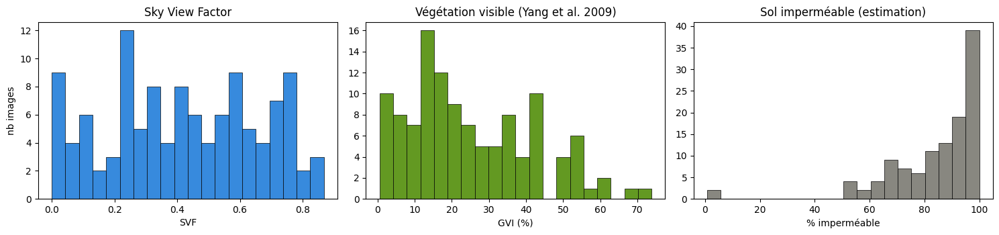

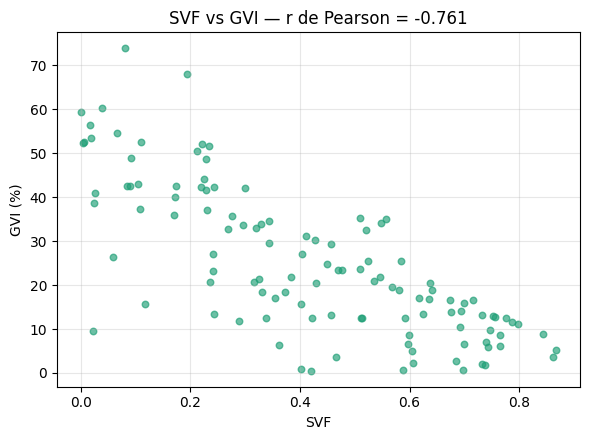

Correlation SVF/GVI : r = -0.761
Une valeur negative est attendue : la canopee qui masque le ciel fait baisser le SVF.


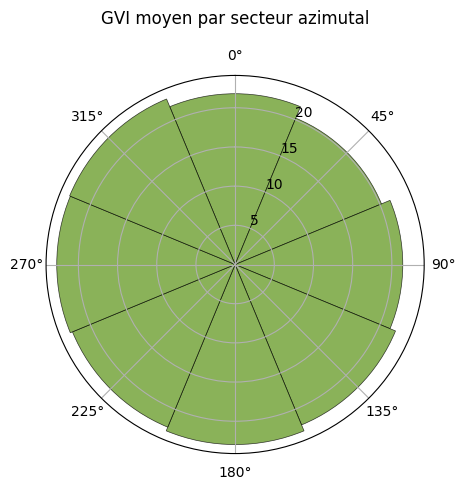

In [10]:
fig, axes = plt.subplots(1, 3, figsize=(15, 3.6))
axes[0].hist(df["SVF"].dropna(), bins=20, color="#378ADD", edgecolor="black", linewidth=0.5)
axes[0].set_xlabel("SVF"); axes[0].set_ylabel("nb images")
axes[0].set_title("Sky View Factor")

axes[1].hist(df["GVI_total_pct"].dropna(), bins=20, color="#639922", edgecolor="black", linewidth=0.5)
axes[1].set_xlabel("GVI (%)"); axes[1].set_title("Végétation visible (Yang et al. 2009)")

axes[2].hist(df["taux_impermeable_pct"].dropna(), bins=20, color="#888780",
             edgecolor="black", linewidth=0.5)
axes[2].set_xlabel("% imperméable"); axes[2].set_title("Sol imperméable (estimation)")
plt.tight_layout(); fig.savefig(OUTPUT_DIR / "distributions.png", dpi=150); plt.show()

# --- Relation SVF / GVI : attendue negative (le feuillage bouche le ciel) ---
fig, ax = plt.subplots(figsize=(6, 4.5))
ax.scatter(df["SVF"], df["GVI_total_pct"], s=22, alpha=0.65, color="#1D9E75")
r = df[["SVF", "GVI_total_pct"]].corr().iloc[0, 1]
ax.set_xlabel("SVF"); ax.set_ylabel("GVI (%)")
ax.set_title(f"SVF vs GVI — r de Pearson = {r:.3f}")
ax.grid(alpha=0.3)
plt.tight_layout(); fig.savefig(OUTPUT_DIR / "svf_vs_gvi.png", dpi=150); plt.show()
print(f"Correlation SVF/GVI : r = {r:.3f}")
print("Une valeur negative est attendue : la canopee qui masque le ciel fait baisser le SVF.")

# --- Rose directionnelle du GVI ---
sect_cols = [c for c in df.columns if c.startswith("GVI_sect")]
moyennes = df[sect_cols].mean().values
angles = np.linspace(0, 2 * np.pi, N_SECTEURS, endpoint=False)
fig, ax = plt.subplots(figsize=(5, 5), subplot_kw=dict(projection="polar"))
ax.bar(angles, moyennes, width=2*np.pi/N_SECTEURS, color="#639922",
       edgecolor="black", linewidth=0.5, alpha=0.75)
ax.set_theta_zero_location("N"); ax.set_theta_direction(-1)
ax.set_title("GVI moyen par secteur azimutal", pad=18)
plt.tight_layout(); fig.savefig(OUTPUT_DIR / "gvi_rose.png", dpi=150); plt.show()

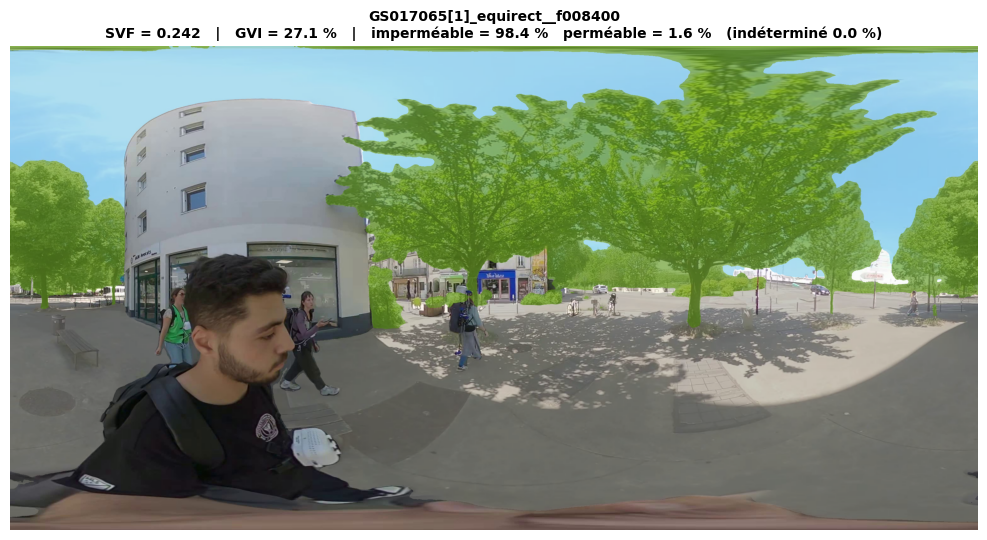

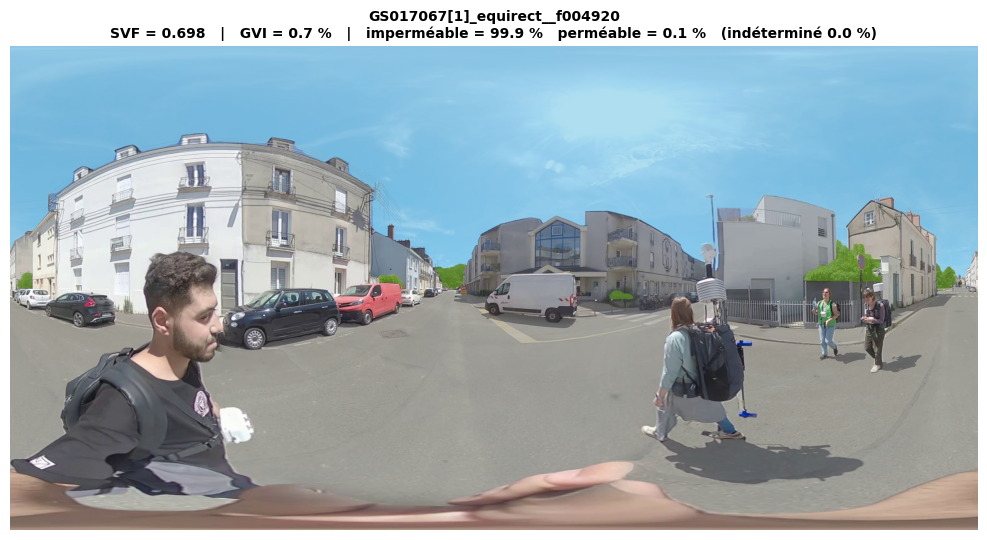

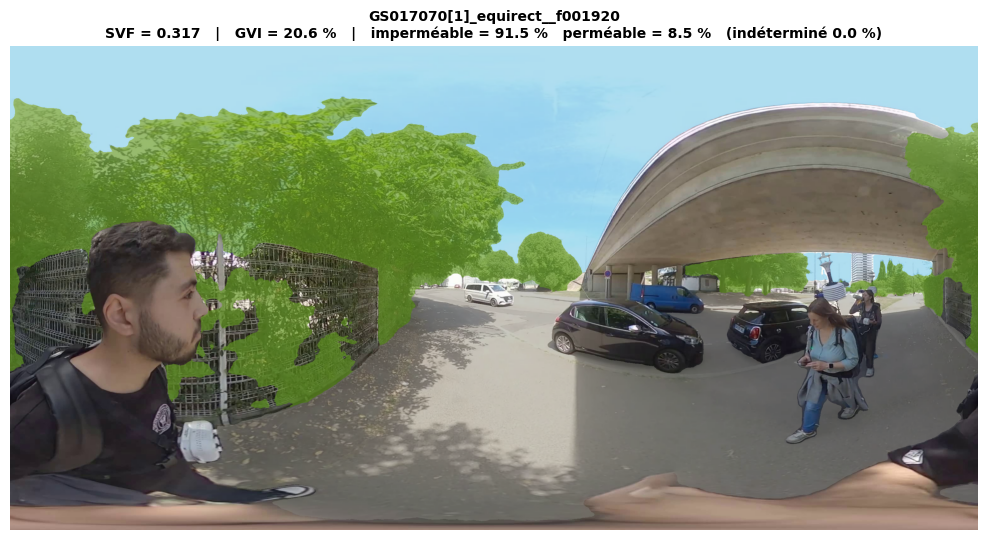

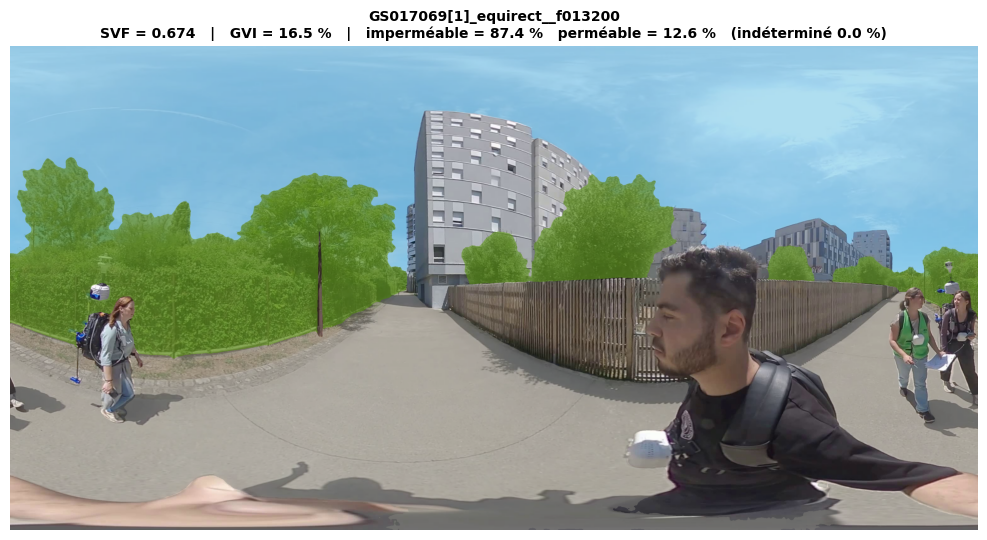

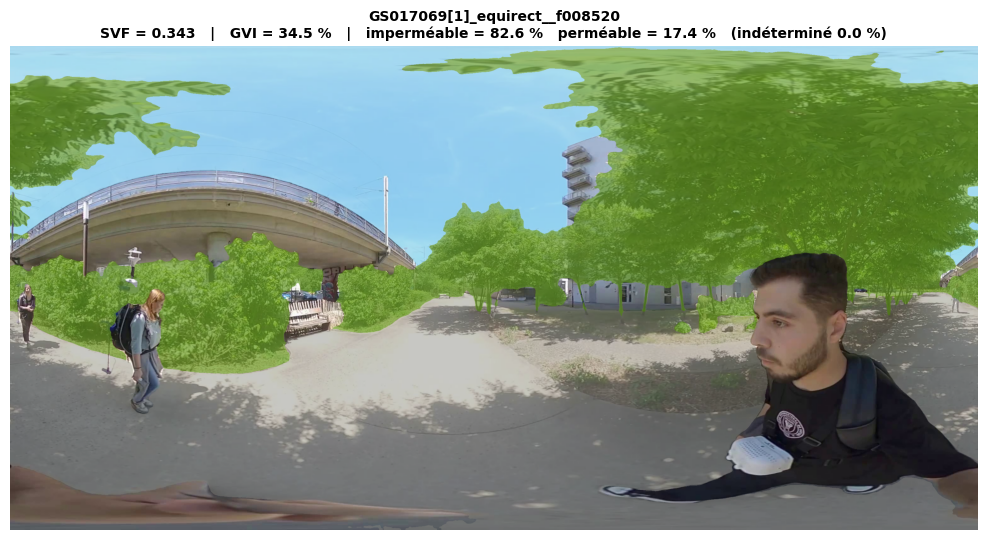

Visualisations : C:\Users\youss\Downloads\coolpath_local\data\outputs\indicateurs_v2\viz
Legende : bleu = ciel (SVF)  |  vert = vegetation (GVI)  |  gris = sol (perméabilité)


In [11]:
# --- Visualisation par image : masques utilises + indicateurs calcules ---
for p in random.Random(1).sample(image_paths, min(5, len(image_paths))):
    r = df[df["image"] == p.stem]
    if r.empty:
        continue
    r = r.iloc[0]
    img = cv2.cvtColor(cv2.imread(str(p)), cv2.COLOR_BGR2RGB)
    sem = load_semantic(p.stem)

    overlay = img.copy()
    m_sky = sem == SEM_SKY
    m_veg = sem == SEM_VEGETATION
    m_sol = np.isin(sem, list(SEM_SOL))
    overlay[m_sky] = (0.35 * img[m_sky] + 0.65 * np.array([135, 206, 235])).astype(np.uint8)
    overlay[m_veg] = (0.35 * img[m_veg] + 0.65 * np.array([99, 153, 34])).astype(np.uint8)
    overlay[m_sol] = (0.55 * img[m_sol] + 0.45 * np.array([136, 135, 128])).astype(np.uint8)

    fig, ax = plt.subplots(figsize=(13, 5.5))
    ax.imshow(overlay)
    ax.set_title(
        f"{p.stem}\n"
        f"SVF = {r['SVF']:.3f}   |   GVI = {r['GVI_total_pct']:.1f} %   |   "
        f"imperméable = {r['taux_impermeable_pct']} %   perméable = {r['taux_permeable_pct']} %   "
        f"(indéterminé {r['taux_indetermine_pct']} %)",
        fontsize=10, fontweight="bold")
    ax.axis("off")
    plt.tight_layout()
    plt.savefig(VIZ_DIR / f"{p.stem}_indicateurs.png", dpi=100, bbox_inches="tight")
    plt.show()

print(f"Visualisations : {VIZ_DIR}")
print("Legende : bleu = ciel (SVF)  |  vert = vegetation (GVI)  |  gris = sol (perméabilité)")

## 7bis. Vérification visuelle de la classification perméable / imperméable

Le panneau précédent (§7) colore tout le sol (`road`+`sidewalk`+`terrain`) en **un seul
gris uniforme** — il ne montre pas *quelle partie* de ce sol est jugée perméable ou
imperméable. Cette section corrige ça : un recouvrement transparent, avec une couleur
par catégorie de `compute_permeabilite()`, pour vérifier **visuellement, image par
image**, si la logique sémantique × matériau (§5) distingue correctement les zones —
demande explicite d'Auline : *terrain + herbe/sol nu = perméable, terrain + revêtement
minéral = imperméable, canopée = non observable (exclue, pas perméable ni imperméable)*.

**Code couleur :**

| Couleur | Catégorie | Condition |
|---|---|---|
| 🟢 vert | perméable | sol (`road`/`sidewalk`/`terrain`) + matériau perméable (`perm_lut == 1`) |
| 🟠 orange/brique | imperméable | sol + matériau imperméable (`perm_lut == 0`) |
| 🟡 jaune | indéterminé | sol + matériau non classé dans la table (`perm_lut == -1`, souvent un symptôme du problème BFMS "Background" déjà documenté) |
| 🟣 violet | canopée non observable | classe `vegetation` (arbres) — exclue du calcul, le sol dessous n'est pas visible |
| — (photo d'origine) | reste | ciel, bâtiments, personnes, véhicules — non concerné par la perméabilité |

Les pourcentages affichés dans le titre viennent **directement de `df`** (pas recalculés
ici) pour garantir que ce que vous voyez correspond exactement aux chiffres exportés.

In [12]:
# =============================================================================
# VERIFICATION VISUELLE — permeable / impermeable / indetermine / canopee
# =============================================================================
COULEUR_PERMEABLE   = np.array([50, 200, 60])    # vert
COULEUR_IMPERMEABLE = np.array([210, 95, 55])    # orange brique
COULEUR_INDETERMINE = np.array([230, 200, 40])   # jaune -- materiau non classe (cf. §5)
COULEUR_CANOPEE     = np.array([150, 100, 190])  # violet -- sol non observable

N_VISU_PERMEABILITE = None   # None = les 116 images ; ou un entier pour un sous-ensemble


def overlay_permeabilite(img, sem, fused, alpha=0.55):
    """Recouvrement transparent : vert=permeable, orange=impermeable,
    jaune=indetermine (materiau non classe), violet=canopee non observable."""
    overlay = img.copy().astype(np.float32)
    valid = sem != 255
    sol = np.isin(sem, list(SEM_SOL)) & valid
    canopee = np.isin(sem, list(SEM_CANOPEE)) & valid

    if fused is not None and sol.any():
        cat = np.full(sem.shape, -2, dtype=np.int8)  # -2 = hors sol, non colore
        cat[sol] = perm_lut[sem[sol].astype(np.int64), fused[sol]]
        m_perm  = sol & (cat == 1)
        m_imperm = sol & (cat == 0)
        m_indet  = sol & (cat == -1)
        overlay[m_perm]   = (1 - alpha) * img[m_perm]   + alpha * COULEUR_PERMEABLE
        overlay[m_imperm] = (1 - alpha) * img[m_imperm] + alpha * COULEUR_IMPERMEABLE
        overlay[m_indet]  = (1 - alpha) * img[m_indet]  + alpha * COULEUR_INDETERMINE
    overlay[canopee] = (1 - alpha) * img[canopee] + alpha * COULEUR_CANOPEE

    return overlay.clip(0, 255).astype(np.uint8)


VIZ_PERM_DIR = OUTPUT_DIR / "viz_permeabilite"
VIZ_PERM_DIR.mkdir(parents=True, exist_ok=True)

a_traiter = image_paths if N_VISU_PERMEABILITE is None else image_paths[:N_VISU_PERMEABILITE]
n_ecrites = 0
for p in a_traiter:
    r = df[df["image"] == p.stem]
    if r.empty:
        continue
    r = r.iloc[0]
    if pd.isna(r["taux_permeable_pct"]):
        continue  # pas de sol observable sur cette image (ou fused absent) -- rien a montrer

    img = cv2.cvtColor(cv2.imread(str(p)), cv2.COLOR_BGR2RGB)
    sem = load_semantic(p.stem)
    fused = load_fused(p.stem)

    overlay = overlay_permeabilite(img, sem, fused)

    fig, ax = plt.subplots(figsize=(13, 5.8))
    ax.imshow(overlay)
    ax.set_title(
        f"{p.stem}\n"
        f"perméable = {r['taux_permeable_pct']} %   |   "
        f"imperméable = {r['taux_impermeable_pct']} %   |   "
        f"indéterminé = {r['taux_indetermine_pct']} %   |   "
        f"canopée non observable = {r['canopee_sol_non_observable_pct']} %",
        fontsize=9, fontweight="bold")
    ax.axis("off")

    # legende couleur (toujours affichee, meme si une categorie est absente sur cette image)
    from matplotlib.patches import Patch
    legende = [
        Patch(facecolor=COULEUR_PERMEABLE / 255, label="perméable"),
        Patch(facecolor=COULEUR_IMPERMEABLE / 255, label="imperméable"),
        Patch(facecolor=COULEUR_INDETERMINE / 255, label="indéterminé (matériau non classé)"),
        Patch(facecolor=COULEUR_CANOPEE / 255, label="canopée (sol non observable)"),
    ]
    ax.legend(handles=legende, loc="lower center", bbox_to_anchor=(0.5, -0.14),
              ncol=4, fontsize=8, frameon=False)

    plt.tight_layout()
    plt.savefig(VIZ_PERM_DIR / f"{p.stem}_permeabilite.png", dpi=110, bbox_inches="tight")
    plt.close(fig)
    n_ecrites += 1

print(f"{n_ecrites} visualisations de permeabilite ecrites -> {VIZ_PERM_DIR}")
print("\nA verifier visuellement :")
print("  1. Le vert suit-il bien l'herbe/le sol nu, jamais le bitume ?")
print("  2. L'orange suit-il bien le bitume/beton, jamais l'herbe ?")
print("  3. Le jaune (indetermine) est-il concentre sur des zones precises,")
print("     ou eparpille partout ? Un jaune massif et diffus confirmerait")
print("     le probleme BFMS \"Background\" deja documente (nb25).")
print("  4. Le violet (canopee) suit-il bien les arbres, pas la pelouse ?")

116 visualisations de permeabilite ecrites -> C:\Users\youss\Downloads\coolpath_local\data\outputs\indicateurs_v2\viz_permeabilite

A verifier visuellement :
  1. Le vert suit-il bien l'herbe/le sol nu, jamais le bitume ?
  2. L'orange suit-il bien le bitume/beton, jamais l'herbe ?
  3. Le jaune (indetermine) est-il concentre sur des zones precises,
     ou eparpille partout ? Un jaune massif et diffus confirmerait
     le probleme BFMS "Background" deja documente (nb25).
  4. Le violet (canopee) suit-il bien les arbres, pas la pelouse ?


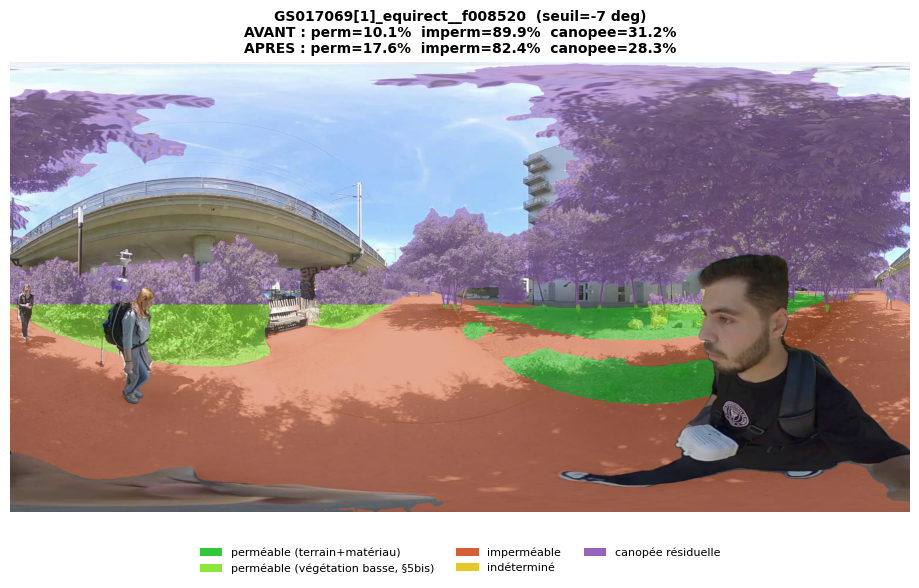

AVANT/APRES ecrit -> C:\Users\youss\Downloads\coolpath_local\data\outputs\indicateurs_v2\viz_permeabilite_v2\GS017069[1]_equirect__f008520_calibration.png

Regardez si le vert clair (vegetation basse) recouvre bien les buissons
que vous aviez entoures en rouge. Si non : ajustez SEUIL_ELEVATION_DEG
(augmentez-le si trop de buissons restent violets, diminuez-le si des
morceaux d'arbres passent a tort en vert clair) et relancez cette cellule.

116 visualisations v2 ecrites -> C:\Users\youss\Downloads\coolpath_local\data\outputs\indicateurs_v2\viz_permeabilite_v2


In [13]:
# =============================================================================
# VERIFICATION VISUELLE v2 -- avec distinction vegetation basse / canopee
# =============================================================================
COULEUR_PERM_BASE     = np.array([50, 200, 60])    # vert -- perm. via terrain+materiau (§5)
COULEUR_PERM_VEG_BASSE = np.array([140, 230, 60])   # vert clair -- perm. via geometrie (§5bis)
COULEUR_IMPERMEABLE   = np.array([210, 95, 55])     # orange brique
COULEUR_INDETERMINE   = np.array([230, 200, 40])    # jaune
COULEUR_CANOPEE       = np.array([150, 100, 190])   # violet -- canopee residuelle seulement


def overlay_permeabilite_v2(img, sem, fused, alpha=0.55):
    overlay = img.copy().astype(np.float32)
    valid = sem != 255
    veg_basse, veg_haute = separer_vegetation_haute_basse(sem)
    sol = np.isin(sem, list(SEM_SOL)) & valid

    if fused is not None and sol.any():
        cat = np.full(sem.shape, -2, dtype=np.int8)
        cat[sol] = perm_lut[sem[sol].astype(np.int64), fused[sol]]
        m_perm, m_imperm, m_indet = sol & (cat == 1), sol & (cat == 0), sol & (cat == -1)
        overlay[m_perm]   = (1-alpha)*img[m_perm]   + alpha*COULEUR_PERM_BASE
        overlay[m_imperm] = (1-alpha)*img[m_imperm] + alpha*COULEUR_IMPERMEABLE
        overlay[m_indet]  = (1-alpha)*img[m_indet]  + alpha*COULEUR_INDETERMINE

    overlay[veg_basse] = (1-alpha)*img[veg_basse] + alpha*COULEUR_PERM_VEG_BASSE
    overlay[veg_haute] = (1-alpha)*img[veg_haute] + alpha*COULEUR_CANOPEE
    return overlay.clip(0, 255).astype(np.uint8)


VIZ_PERM_V2_DIR = OUTPUT_DIR / "viz_permeabilite_v2"
VIZ_PERM_V2_DIR.mkdir(parents=True, exist_ok=True)

# --- Lancez d'abord sur l'image que vous avez annotee, pour calibrer le seuil ---
stem_test = "GS017069[1]_equirect__f008520"
p_test = next((p for p in image_paths if p.stem == stem_test), None)
if p_test is not None:
    img = cv2.cvtColor(cv2.imread(str(p_test)), cv2.COLOR_BGR2RGB)
    sem = load_semantic(p_test.stem)
    fused = load_fused(p_test.stem)
    r_old = compute_permeabilite(sem, fused)
    r_new = compute_permeabilite_v2(sem, fused)
    overlay = overlay_permeabilite_v2(img, sem, fused)

    fig, ax = plt.subplots(figsize=(13, 6))
    ax.imshow(overlay)
    ax.set_title(
        f"{p_test.stem}  (seuil={SEUIL_ELEVATION_DEG} deg)\n"
        f"AVANT : perm={r_old[1]}%  imperm={r_old[0]}%  canopee={r_old[4]}%\n"
        f"APRES : perm={r_new[1]}%  imperm={r_new[0]}%  canopee={r_new[4]}%",
        fontsize=10, fontweight="bold")
    ax.axis("off")
    from matplotlib.patches import Patch
    legende = [
        Patch(facecolor=COULEUR_PERM_BASE/255, label="perméable (terrain+matériau)"),
        Patch(facecolor=COULEUR_PERM_VEG_BASSE/255, label="perméable (végétation basse, §5bis)"),
        Patch(facecolor=COULEUR_IMPERMEABLE/255, label="imperméable"),
        Patch(facecolor=COULEUR_INDETERMINE/255, label="indéterminé"),
        Patch(facecolor=COULEUR_CANOPEE/255, label="canopée résiduelle"),
    ]
    ax.legend(handles=legende, loc="lower center", bbox_to_anchor=(0.5, -0.16),
              ncol=3, fontsize=8, frameon=False)
    plt.tight_layout()
    plt.savefig(VIZ_PERM_V2_DIR / f"{p_test.stem}_calibration.png", dpi=110, bbox_inches="tight")
    plt.show()
    print(f"AVANT/APRES ecrit -> {VIZ_PERM_V2_DIR / (p_test.stem + '_calibration.png')}")
    print("\nRegardez si le vert clair (vegetation basse) recouvre bien les buissons")
    print("que vous aviez entoures en rouge. Si non : ajustez SEUIL_ELEVATION_DEG")
    print("(augmentez-le si trop de buissons restent violets, diminuez-le si des")
    print("morceaux d'arbres passent a tort en vert clair) et relancez cette cellule.")
else:
    print(f"Image {stem_test} introuvable dans image_paths -- verifiez IMG_DIR")

# --- Une fois le seuil calibre, relancer sur les 116 images ---
n_ecrites = 0
for p in image_paths:
    sem = load_semantic(p.stem)
    fused = load_fused(p.stem)
    if fused is None:
        continue
    img = cv2.cvtColor(cv2.imread(str(p)), cv2.COLOR_BGR2RGB)
    r = compute_permeabilite_v2(sem, fused)
    overlay = overlay_permeabilite_v2(img, sem, fused)

    fig, ax = plt.subplots(figsize=(13, 5.8))
    ax.imshow(overlay)
    ax.set_title(f"{p.stem}\nperméable={r[1]}%  imperméable={r[0]}%  "
                f"indéterminé={r[2]}%  canopée={r[4]}%", fontsize=9, fontweight="bold")
    ax.axis("off")
    plt.tight_layout()
    plt.savefig(VIZ_PERM_V2_DIR / f"{p.stem}_permeabilite_v2.png", dpi=100, bbox_inches="tight")
    plt.close(fig)
    n_ecrites += 1

print(f"\n{n_ecrites} visualisations v2 ecrites -> {VIZ_PERM_V2_DIR}")

### Comparaison v2 (sans filtre de largeur) vs v3 (avec, §5ter)

Cette cellule utilise `overlay_permeabilite_v2`/`v3` et `compute_permeabilite_v2`/`v3` --
toutes deja definies (§5bis, §5ter, §7bis) au moment ou ce notebook s'execute dans
l'ordre. Regardez si les zones qui etaient a tort en vert clair (troncs proches,
version v2) repassent en violet dans le panneau v3, sans perdre les vraies haies larges.

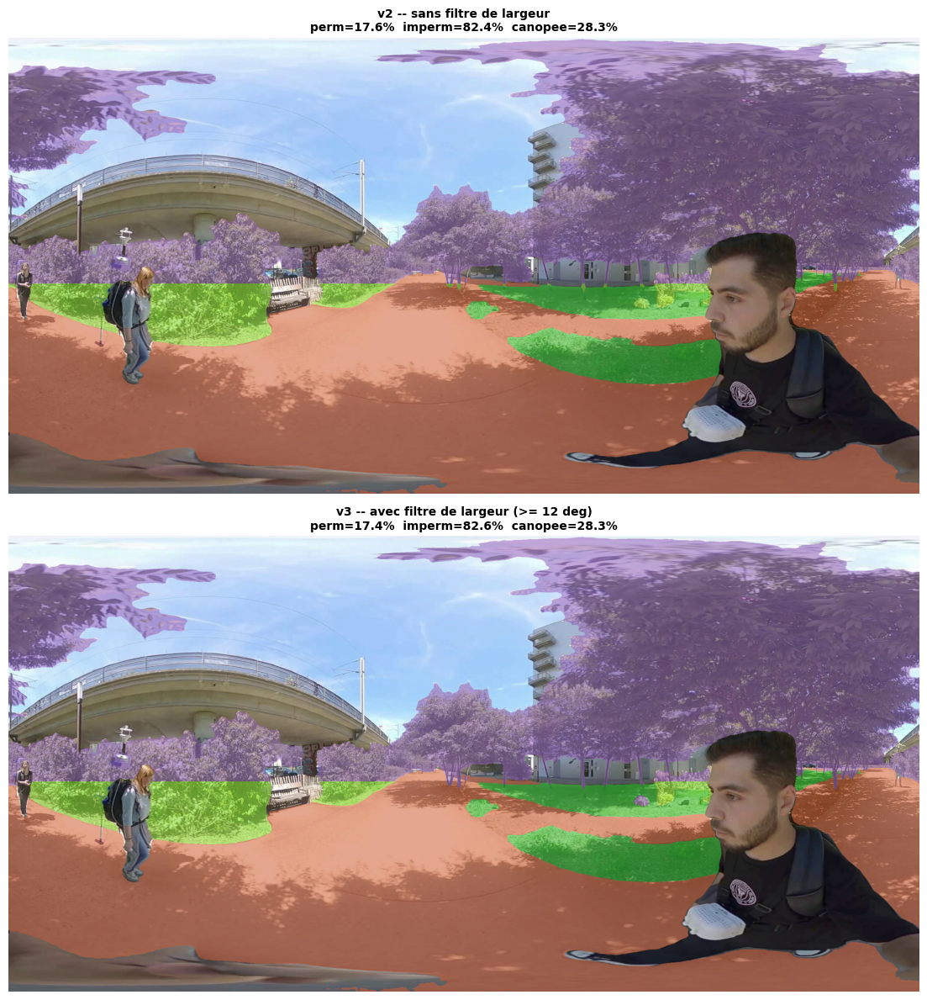


Comparaison ecrite -> C:\Users\youss\Downloads\coolpath_local\data\outputs\indicateurs_v2\viz_permeabilite_v2\GS017069[1]_equirect__f008520_comparaison_v2_v3.png
Verifiez si les zones qui etaient a tort en vert clair (troncs proches)
sont repassees en violet dans le panneau v3, sans perdre les vraies haies.


In [14]:
# --- Comparaison visuelle v2 (sans filtre) vs v3 (avec filtre de largeur) ---
stem_test = "GS017069[1]_equirect__f008520"
p_test = next((p for p in image_paths if p.stem == stem_test), None)
if p_test is not None:
    img = cv2.cvtColor(cv2.imread(str(p_test)), cv2.COLOR_BGR2RGB)
    sem = load_semantic(p_test.stem)
    fused = load_fused(p_test.stem)
    r_v2 = compute_permeabilite_v2(sem, fused)
    r_v3 = compute_permeabilite_v3(sem, fused)

    fig, axes = plt.subplots(2, 1, figsize=(13, 12))
    for ax, ov, r, titre in [
        (axes[0], overlay_permeabilite_v2(img, sem, fused), r_v2, "v2 -- sans filtre de largeur"),
        (axes[1], overlay_permeabilite_v3(img, sem, fused), r_v3, "v3 -- avec filtre de largeur (>= %d deg)" % SEUIL_LARGEUR_DEG),
    ]:
        ax.imshow(ov)
        ax.set_title(f"{titre}\nperm={r[1]}%  imperm={r[0]}%  canopee={r[4]}%",
                     fontsize=10, fontweight="bold")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(VIZ_PERM_V2_DIR / f"{stem_test}_comparaison_v2_v3.png", dpi=110, bbox_inches="tight")
    plt.show()
    print(f"\nComparaison ecrite -> {VIZ_PERM_V2_DIR / (stem_test + '_comparaison_v2_v3.png')}")
    print("Verifiez si les zones qui etaient a tort en vert clair (troncs proches)")
    print("sont repassees en violet dans le panneau v3, sans perdre les vraies haies.")
else:
    print(f"Image {stem_test} introuvable -- verifiez IMG_DIR")

### Calibration systématique du seuil

Plutôt que de changer `SEUIL_ELEVATION_DEG` et relancer les cellules une par une,
la cellule suivante teste plusieurs valeurs d'un coup sur l'image annotée et les
affiche côte à côte, avec le taux de perméabilité obtenu pour chacune. Choisissez
le seuil le plus bas qui recouvre encore bien les buissons observés — un seuil
trop haut ferait déborder sur de la vraie canopée.

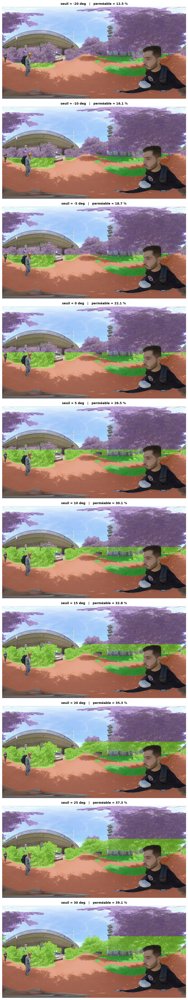

Balayage ecrit -> C:\Users\youss\Downloads\coolpath_local\data\outputs\indicateurs_v2\viz_permeabilite_v2\GS017069[1]_equirect__f008520_balayage_seuils.png

Choisissez le seuil le plus BAS qui recouvre encore bien les buissons que
vous aviez entoures -- un seuil trop haut classerait a tort des morceaux
de vraie canopee en 'vegetation basse'.

Une fois choisi, reportez la valeur dans SEUIL_ELEVATION_DEG (§5bis) ET
re-executez cette cellule-la pour que le reste du notebook l'utilise.


In [15]:
# =============================================================================
# CALIBRATION DU SEUIL -- balayage visuel sur l'image annotee
# =============================================================================
SEUILS_A_TESTER = [-20, -10, -5, 0, 5, 10, 15, 20, 25, 30]  # deg. elevation ; <0 = sous l'horizon


def overlay_permeabilite_seuil(img, sem, fused, seuil_deg, alpha=0.55):
    # Identique a overlay_permeabilite_v2, mais avec un seuil explicite --
    # utile pour comparer plusieurs valeurs sans re-executer la cellule §5bis.
    overlay = img.copy().astype(np.float32)
    valid = sem != 255
    veg_basse, veg_haute = separer_vegetation_haute_basse(sem, seuil_elevation_deg=seuil_deg)
    sol = np.isin(sem, list(SEM_SOL)) & valid

    if fused is not None and sol.any():
        cat = np.full(sem.shape, -2, dtype=np.int8)
        cat[sol] = perm_lut[sem[sol].astype(np.int64), fused[sol]]
        m_perm, m_imperm, m_indet = sol & (cat == 1), sol & (cat == 0), sol & (cat == -1)
        overlay[m_perm]   = (1-alpha)*img[m_perm]   + alpha*COULEUR_PERM_BASE
        overlay[m_imperm] = (1-alpha)*img[m_imperm] + alpha*COULEUR_IMPERMEABLE
        overlay[m_indet]  = (1-alpha)*img[m_indet]  + alpha*COULEUR_INDETERMINE

    overlay[veg_basse] = (1-alpha)*img[veg_basse] + alpha*COULEUR_PERM_VEG_BASSE
    overlay[veg_haute] = (1-alpha)*img[veg_haute] + alpha*COULEUR_CANOPEE

    n_sol_base = int(sol.sum())
    n_veg_basse = int(veg_basse.sum())
    n_sol = n_sol_base + n_veg_basse
    pct_perm = None
    if fused is not None and n_sol > 0:
        n_perm = int((cat[sol] == 1).sum()) + n_veg_basse
        pct_perm = round(n_perm / n_sol * 100, 1)
    return overlay.clip(0, 255).astype(np.uint8), pct_perm


stem_test = "GS017069[1]_equirect__f008520"
p_test = next((p for p in image_paths if p.stem == stem_test), None)
assert p_test is not None, f"{stem_test} introuvable dans image_paths"

img = cv2.cvtColor(cv2.imread(str(p_test)), cv2.COLOR_BGR2RGB)
sem = load_semantic(p_test.stem)
fused = load_fused(p_test.stem)

fig, axes = plt.subplots(len(SEUILS_A_TESTER), 1, figsize=(13, 4.6 * len(SEUILS_A_TESTER)))
for ax, seuil in zip(axes, SEUILS_A_TESTER):
    overlay, pct_perm = overlay_permeabilite_seuil(img, sem, fused, seuil)
    ax.imshow(overlay)
    ax.set_title(f"seuil = {seuil} deg   |   perméable = {pct_perm} %", fontsize=10, fontweight="bold")
    ax.axis("off")
plt.tight_layout()
plt.savefig(VIZ_PERM_V2_DIR / f"{stem_test}_balayage_seuils.png", dpi=100, bbox_inches="tight")
plt.show()

print(f"Balayage ecrit -> {VIZ_PERM_V2_DIR / (stem_test + '_balayage_seuils.png')}")
print("\nChoisissez le seuil le plus BAS qui recouvre encore bien les buissons que")
print("vous aviez entoures -- un seuil trop haut classerait a tort des morceaux")
print("de vraie canopee en 'vegetation basse'.")
print("\nUne fois choisi, reportez la valeur dans SEUIL_ELEVATION_DEG (§5bis) ET")
print("re-executez cette cellule-la pour que le reste du notebook l'utilise.")

## 8. Limites — à présenter avec les résultats

**SVF**
1. Une erreur de segmentation `sky` se propage directement dans le SVF : les vitrages réfléchissants et le flou de mouvement en haut d'image sont les cas les plus risqués.
2. S2 (§3.4) montre que le **choix du seuil de binarisation** fait varier le SVF de ~6 % sur une même image, en particulier sur les scènes très arborées où le feuillage crée un dégradé. Ici la binarisation vient d'un modèle appris, pas d'un seuil manuel — le problème est déplacé, pas supprimé.
3. Le porteur du sac occupe une partie du nadir, mais cela n'affecte pas le SVF (calculé sur le seul hémisphère supérieur).

**GVI**
4. Deux définitions coexistent (§4). Reporter `GVI_aire` (standard S3) et mentionner l'écart.
5. **Biais saisonnier** : le dataset est intégralement estival, feuillage plein. Un GVI hivernal (branches nues) serait très différent — limite documentée du projet.

**Perméabilité**
6. Classification **non normative** (§5) — jugement d'ingénierie, à faire valider.
7. La **règle contextuelle des arbres de S5** (Cerema/AURCA) n'est pas implémentée : un arbre en fosse bitumée est traité comme végétation, pas comme sol imperméable.
8. Le taux `indéterminé` doit rester faible ; il est reporté systématiquement comme garde-fou (§7).
9. **Perméabilité visible ≠ perméabilité réelle** : un sol en terre fortement tassé est hydrologiquement imperméable tout en paraissant perméable. S5 note explicitement que les sols rendus imperméables par tassement ne sont pas identifiables par télédétection — la même limite s'applique ici.

**Étape suivante** : jointure de ces indicateurs avec les traces GPS et les mesures Comfy'Pack, puis corrélation statistique (méthode Kim & Brown 2022, **S4**).